# Section B : Deep Learning Model

Import Required Libraries

In [1]:
import os
import random
import shutil
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.train import BytesList, FloatList, Int64List, Example, Features, Feature
import cv2
from tqdm import tqdm
#import tensorflow_addons as tfa

Set Paths

This code initializes the directory structure for a PPE detection project. It defines paths for training, validation, and test images and labels, stored under a base folder (`Merged_v2`) in Google Drive. It also creates a `tfrecords` folder to store TFRecord files, which are needed for training object detection models using TensorFlow. This setup ensures clean organization and smooth data processing for model development.


In [2]:
# Define base paths
BASE_DIR = 'Merged_v2'
IMAGE_DIR = os.path.join(BASE_DIR, 'images')
LABEL_DIR = os.path.join(BASE_DIR, 'labels')

# Target folders
TRAIN_IMG_DIR = os.path.join(BASE_DIR, 'train/images')
VAL_IMG_DIR = os.path.join(BASE_DIR, 'val/images')
TEST_IMG_DIR = os.path.join(BASE_DIR, 'test/images')

TRAIN_LABEL_DIR = os.path.join(BASE_DIR, 'train/labels')
VAL_LABEL_DIR = os.path.join(BASE_DIR, 'val/labels')
TEST_LABEL_DIR = os.path.join(BASE_DIR, 'test/labels')

TFRECORD_DIR = os.path.join(BASE_DIR, 'tfrecords')
os.makedirs(TFRECORD_DIR, exist_ok=True)


Create Folder Structure

In [3]:
# Create directories
for folder in [TRAIN_IMG_DIR, VAL_IMG_DIR, TEST_IMG_DIR, TRAIN_LABEL_DIR, VAL_LABEL_DIR, TEST_LABEL_DIR]:
    os.makedirs(folder, exist_ok=True)


Match Images and Labels

In [4]:
# List all images and labels
images = [f for f in os.listdir(IMAGE_DIR) if f.endswith(('.jpg', '.jpeg', '.png'))]
labels = [f for f in os.listdir(LABEL_DIR) if f.endswith('.txt')]

# Match files based on filename (without extension)
matched_files = []
for img_file in images:
    base_name = os.path.splitext(img_file)[0]
    if f"{base_name}.txt" in labels:
        matched_files.append(base_name)

print(f"Total matched pairs: {len(matched_files)}")


Total matched pairs: 1416


Train-Validation-Test Split

Shuffles the dataset (`matched_files`) with a fixed seed for reproducibility.
Splits 10% of data for testing and 20% of the remaining for validation.
Ensures balanced and randomized splits for training, validation, and testing.
Prints the count of samples in each set.


In [5]:
# Shuffle before split
random.seed(42)  # for reproducibility
random.shuffle(matched_files)


train_files, test_files = train_test_split(matched_files, test_size=0.1, random_state=42)
train_files, val_files = train_test_split(train_files, test_size=0.2, random_state=42)


print(f"Total Samples: {len(images)}")
print(f"Training Samples: {len(train_files)}")
print(f"Validation Samples: {len(val_files)}")
print(f"Testing Samples: {len(test_files)}")


Total Samples: 1416
Training Samples: 1019
Validation Samples: 255
Testing Samples: 142


Move Files

This code moves image-label pairs into their respective train, validation, and test folders using multithreading for faster execution. It checks for multiple image extensions and ensures each file has a matching label. Any missing images or labels are reported. Progress is shown with a progress bar using `tqdm`.


In [6]:
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm

def move_single_file(base_name, img_src, lbl_src, img_dest, lbl_dest):
    result = {'file': base_name, 'status': 'OK'}

    # Try multiple image extensions
    found = False
    for ext in ['.jpg', '.jpeg', '.png']:
        img_path = os.path.join(img_src, base_name + ext)
        if os.path.exists(img_path):
            shutil.copy(img_path, os.path.join(img_dest, os.path.basename(img_path)))
            found = True
            break
    if not found:
        result['status'] = 'Missing image'

    # Always assume label is .txt
    lbl_path = os.path.join(lbl_src, base_name + '.txt')
    if os.path.exists(lbl_path):
        shutil.copy(lbl_path, os.path.join(lbl_dest, os.path.basename(lbl_path)))
    else:
        result['status'] = 'Missing label' if result['status'] == 'OK' else 'Missing image + label'

    return result

def move_files_parallel(file_list, img_src, lbl_src, img_dest, lbl_dest, max_workers=8):
    print(f"Moving {len(file_list)} files in parallel...")
    results = []
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        futures = {
            executor.submit(move_single_file, base_name, img_src, lbl_src, img_dest, lbl_dest): base_name
            for base_name in file_list
        }
        for f in tqdm(as_completed(futures), total=len(file_list)):
            result = f.result()
            results.append(result)

    # Summary
    missing = [r for r in results if r['status'] != 'OK']
    if missing:
        print(f"{len(missing)} files had issues:")
        for m in missing:
            print(f"  - {m['file']}: {m['status']}")
    else:
        print("All files moved successfully!")

# Usage:
move_files_parallel(train_files, IMAGE_DIR, LABEL_DIR, TRAIN_IMG_DIR, TRAIN_LABEL_DIR)
move_files_parallel(val_files, IMAGE_DIR, LABEL_DIR, VAL_IMG_DIR, VAL_LABEL_DIR)
move_files_parallel(test_files, IMAGE_DIR, LABEL_DIR, TEST_IMG_DIR, TEST_LABEL_DIR)


Moving 1019 files in parallel...


100%|███████████████████████████████████████████████████████████████████████████████████████| 1019/1019 [00:00<00:00, 1681.92it/s]


All files moved successfully!
Moving 255 files in parallel...


100%|█████████████████████████████████████████████████████████████████████████████████████████| 255/255 [00:00<00:00, 1669.45it/s]


All files moved successfully!
Moving 142 files in parallel...


100%|█████████████████████████████████████████████████████████████████████████████████████████| 142/142 [00:00<00:00, 2092.21it/s]

All files moved successfully!


a) perform any necessary data pre-processing to optimize the dataset for successful training, such as resizing images, converting colour spaces, or normalizing pixel values.

Data Preprocessing: Normalize Images

This function reads an image file using TensorFlow, decodes it as a JPEG with 3 color channels, and normalizes pixel values to the `[0, 1]` range as `float32`. It's commonly used for preprocessing images before feeding them into a deep learning model.


In [7]:
def load_image(filepath):
    image = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)  # Normalizes to [0,1]
    return image


Data Augmentation: Flip, Brightness, Contrast, Zoom, Rotation

This function applies random data augmentation to an input image to improve model generalization. It includes horizontal flipping, brightness, contrast, saturation, and hue adjustments—ideal for training-time augmentation in computer vision tasks.


In [8]:
def augment_image_test(image):
    # Random horizontal flip
    image = tf.image.random_flip_left_right(image)

    # Random brightness
    image = tf.image.random_brightness(image, max_delta=0.2)

    # Random contrast
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)

    # Random saturation
    image = tf.image.random_saturation(image, lower=0.8, upper=1.2)

    # Random hue
    image = tf.image.random_hue(image, max_delta=0.05)

    return image


Visualization

This function visualizes the effect of data augmentation by displaying the original and augmented versions of a randomly selected training image side by side. It helps verify how augmentation transforms the image and ensures it's applied correctly before training.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.054128222..1.2598097].


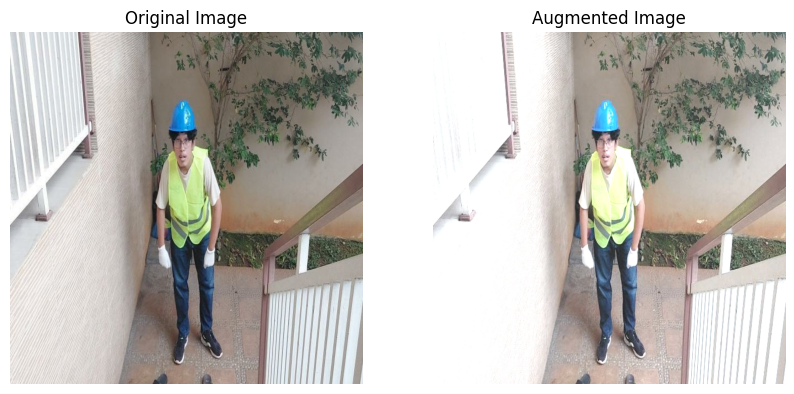

In [9]:
def visualize_sample(img_path):
    image = load_image(img_path)
    augmented_image = augment_image_test(image)

    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(augmented_image)
    plt.title("Augmented Image")
    plt.axis('off')
    plt.show()

# Example
sample_image_path = os.path.join(TRAIN_IMG_DIR, random.choice(os.listdir(TRAIN_IMG_DIR)))
visualize_sample(sample_image_path)


c) visualize sample images from the dataset using a popular visualization library, such as Matplotlib's
pyplot, to gain insights into the data distribution and quality.

This script randomly selects and visualizes one image from the dataset, along with its bounding boxes and class labels from the corresponding YOLO-format `.txt` file. It:

* Loads the image and its annotation.
* Converts YOLO-format normalized coordinates to pixel values.
* Draws bounding boxes and class names on the image.
* Displays the annotated image using `matplotlib`.

Useful for verifying that annotations are correctly aligned with objects in the images.


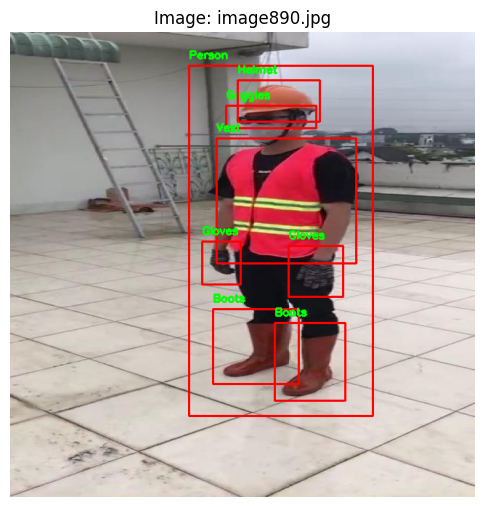

In [10]:
IMAGE_FOLDER = f'Merged_v2/images'
LABEL_FOLDER = f'Merged_v2/labels'
CLASS_NAMES = [
    "Helmet",
    "Gloves",
    "Vest",
    "Boots",
    "Goggles",
    "none",
    "Person",
    "no_helmet",
    "no_goggle",
    "no_gloves",
    "no_boots"
]


# How many random images to check
NUM_IMAGES_TO_CHECK = 1

# Pick random images
all_images = [img for img in os.listdir(IMAGE_FOLDER) if img.endswith(".jpg") or img.endswith(".png") or img.endswith(".jpeg")]
selected_images = random.sample(all_images, NUM_IMAGES_TO_CHECK)

for img_name in selected_images:
    img_path = os.path.join(IMAGE_FOLDER, img_name)
    label_path = os.path.join(LABEL_FOLDER, img_name.replace(".jpg", ".txt").replace(".png", ".txt").replace(".jpeg", ".txt"))

    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    # Check if label exists
    if not os.path.exists(label_path):
        print(f"No label found for {img_name}")
        continue

    # Load label
    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center, y_center, width, height = map(float, parts[1:])

        # Convert from YOLO format to pixel coordinates
        x1 = int((x_center - width/2) * w)
        y1 = int((y_center - height/2) * h)
        x2 = int((x_center + width/2) * w)
        y2 = int((y_center + height/2) * h)

        # Draw rectangle
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

        # Draw label (UPDATED)
        label = CLASS_NAMES[class_id] if class_id < len(CLASS_NAMES) else str(class_id)
        font_scale = 0.5  # <-- Increase font size
        thickness = 2     # <-- Make text thicker
        color = (0, 255, 0)  # Green for normal
        cv2.putText(img, label, (x1, max(20, y1-10)), cv2.FONT_HERSHEY_SIMPLEX, font_scale, color, thickness)


    # Show image
    plt.figure(figsize=(6, 8))
    plt.imshow(img)
    plt.title(f"Image: {img_name}")
    plt.axis('off')
    plt.show()


Dataset Statistics

This script analyzes class distribution in the training set by:

* Counting how many times each class ID appears across all YOLO label files.
* Displaying the count for each class in the console.
* Plotting a histogram to visualize class imbalance (if any).

It's useful for understanding dataset bias and deciding if techniques like class weighting or augmentation are needed.


100%|████████████████████████████████████████████████████████████████████████████████████████| 1304/1304 [00:01<00:00, 714.32it/s]


Class distribution in Training Set:
Class 1: 1338 instances
Class 6: 2078 instances
Class 0: 1612 instances
Class 2: 1508 instances
Class 3: 1475 instances
Class 7: 445 instances
Class 5: 733 instances
Class 9: 502 instances
Class 8: 373 instances
Class 4: 482 instances
Class 10: 99 instances


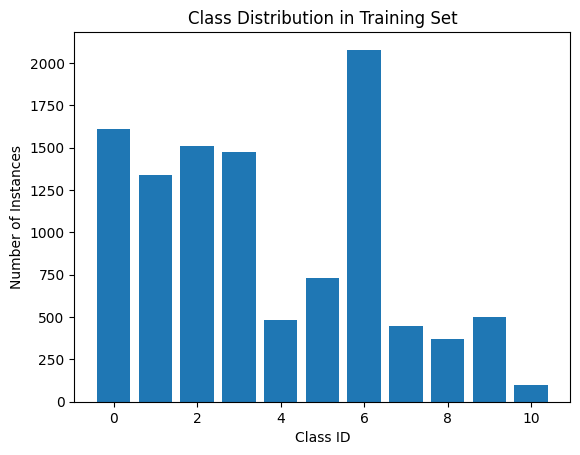

In [11]:
import collections

# Read labels and count classes
class_counter = collections.Counter()

for lbl_file in tqdm(os.listdir(TRAIN_LABEL_DIR)):
    with open(os.path.join(TRAIN_LABEL_DIR, lbl_file), 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id = int(line.split()[0])
            class_counter[class_id] += 1

print("Class distribution in Training Set:")
for cls, count in class_counter.items():
    print(f"Class {cls}: {count} instances")

# Plot histogram
plt.bar(class_counter.keys(), class_counter.values())
plt.title('Class Distribution in Training Set')
plt.xlabel('Class ID')
plt.ylabel('Number of Instances')
plt.show()


Define Helper Functions for TFRecord

In [12]:
# Class map (index should match 0–10)
NUM_CLASSES = 11

def _bytes_feature(value):
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _int64_feature(value_list):
    return tf.train.Feature(int64_list=tf.train.Int64List(value=value_list))

Parse YOLO Labels and Create TFRecord Example

This function creates a TensorFlow `Example` for multi-label classification:

* **Reads and encodes** the image file.
* **Parses the label file** to build a multi-hot vector representing all present classes.
* **Packages data** into a `tf.train.Example`, including the image, filename, and label vector.

This is useful for converting datasets into TFRecord format, which is efficient for training TensorFlow models.


In [13]:
def create_tf_example(image_path, label_path):
    # Read image
    with tf.io.gfile.GFile(image_path, 'rb') as fid:
        encoded_image = fid.read()

    # Get label vector (multi-hot)
    label_vector = [0] * NUM_CLASSES
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0]) - 1  # Shift to 0-based
            if 0 <= class_id < NUM_CLASSES:
                label_vector[class_id] = 1

    # TF Example
    filename = os.path.basename(image_path).encode('utf-8')
    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/encoded': _bytes_feature(encoded_image),
        'image/filename': _bytes_feature(filename),
        'labels': _int64_feature(label_vector)
    }))
    return tf_example

Write TFRecord File

This function converts a folder of images and corresponding YOLO-format labels into a TFRecord file:

* Iterates through all images, checks for matching label files.
* Uses `create_tf_example` to convert each image-label pair into a serialized TensorFlow `Example`.
* Writes each serialized example to the specified TFRecord file.

It's essential for preparing data for training models using TensorFlow’s efficient input pipeline.


In [14]:
def create_tfrecord(image_dir, label_dir, output_path):
    writer = tf.io.TFRecordWriter(output_path)
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    for img_file in tqdm(image_files, desc=f'Writing {output_path}'):
        base_name = os.path.splitext(img_file)[0]
        image_path = os.path.join(image_dir, img_file)
        label_path = os.path.join(label_dir, base_name + '.txt')

        if not os.path.exists(label_path):
            print(f"Label file missing for {img_file}, skipping...")
            continue

        tf_example = create_tf_example(image_path, label_path)
        writer.write(tf_example.SerializeToString())

    writer.close()
    print(f"TFRecord written to: {output_path}")

Define Class Mapping

In [15]:
# Class Mapping for your PPE dataset
class_map = {
    0: 'Helmet',
    1: 'Gloves',
    2: 'Vest',
    3: 'Boots',
    4: 'Goggles',
    5: 'none',
    6: 'Person',
    7: 'no_helmet',
    8: 'no_goggle',
    9: 'no_gloves',
    10: 'no_boots'
}


This code generates TFRecord files for the training, validation, and test datasets by:

* Calling `create_tfrecord()` for each dataset split.
* Converting image-label pairs into serialized TensorFlow Examples.
* Saving them into `.record` files for efficient use with TensorFlow training pipelines.

It prepares the dataset for use in models like Faster R-CNN using the TensorFlow Object Detection API.


In [16]:

# Set your actual paths
create_tfrecord(
    image_dir='Merged_v2/train/images',
    label_dir='Merged_v2/train/labels',
    output_path='Merged_v2/tfrecords/train.record'
)

create_tfrecord(
    image_dir='Merged_v2/val/images',
    label_dir='Merged_v2/val/labels',
    output_path='Merged_v2/tfrecords/val.record'
)

create_tfrecord(
    image_dir='Merged_v2/test/images',
    label_dir='Merged_v2/test/labels',
    output_path='Merged_v2/tfrecords/test.record'
)


Writing Merged_v2/tfrecords/train.record: 100%|██████████████████████████████████████████████| 1304/1304 [00:01<00:00, 783.96it/s]


TFRecord written to: Merged_v2/tfrecords/train.record


Writing Merged_v2/tfrecords/val.record: 100%|██████████████████████████████████████████████████| 466/466 [00:00<00:00, 502.76it/s]


TFRecord written to: Merged_v2/tfrecords/val.record


Writing Merged_v2/tfrecords/test.record: 100%|████████████████████████████████████████████████| 268/268 [00:00<00:00, 1025.64it/s]

TFRecord written to: Merged_v2/tfrecords/test.record


 d) design and implement the Convolutional Neural Network (CNN) architecture. Using an Artificial
Neural Network (ANN) is not permitted for this assignment. Additionally, the model must be
built exclusively with the TensorFlow Keras package.

This code builds a **multi-label image classification model** using **EfficientNetV2B3** as a feature extractor:

* **EfficientNetV2B3** is loaded pre-trained (on ImageNet) without its classification head.
* Its layers are **frozen** to retain learned features.
* A **custom head** is added: global average pooling → dropout → dense layer → final dense layer with **sigmoid** activation (for 11 independent class outputs).
* The model is ready for training on tasks like PPE compliance detection, where multiple labels (e.g., helmet, gloves) can be present per image.


In [17]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications import EfficientNetV2B3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Input shape: flexible height & width, 3 channels
input_tensor = tf.keras.Input(shape=(None, None, 3))

# Pre-trained EfficientNetV2B3 (without top)
base_model = EfficientNetV2B3(include_top=False, weights='imagenet', input_tensor=input_tensor)

# Freeze base model
base_model.trainable = False

# Custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
x = Dense(128, activation='relu')(x)
output = Dense(11, activation='sigmoid')(x)  # 11 classes

# Final model
model = Model(inputs=input_tensor, outputs=output)


Compile Model

This code compiles the multi-label classification model with:

* **Adam optimizer** at a learning rate of `1e-4` for stable convergence.
* **Binary cross-entropy loss**, suitable for multi-label problems where each class is independent.
* Evaluation metrics:

  * **Accuracy**: proportion of correctly predicted labels.
  * **AUC** (Area Under ROC Curve): measures the quality of class separation, useful for imbalanced datasets.

It's now ready for training on a multi-label PPE detection task.


In [18]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss='binary_crossentropy',  # multi-label loss
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)


e) summary of the model architecture in a form of a plot or text

# Model Structure

**1.Input Layer**

    Shape: (None, None, 3)

    Accepts RGB images of any height/width.

**2.Base Model: EfficientNetV2B3**

    Pre-trained on ImageNet.

    include_top=False means it excludes its default classifier.

    trainable = False freezes all weights — used for feature extraction only.

    Parameters from this part are non-trainable (fixed).

**3.Custom Head**

    GlobalAveragePooling2D: Reduces each feature map to a single value, making it flat and ready for dense layers.

    Dropout(0.3): Prevents overfitting by randomly deactivating 30% of neurons during training.

    Dense(128, activation='relu'): A fully connected layer to learn more abstract features.

    Dense(11, activation='sigmoid'): Outputs 11 probability scores between 0 and 1, each representing the presence or absence of a class (multi-label).

**Parameter Count**

    Trainable params: Parameters in the custom classification head (e.g., Dense layers).

    Non-trainable params: All parameters in the frozen EfficientNetV2B3.

    Total params: Sum of all parameters in the model.

In [19]:
# Text summary
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, None,      │          0 │ input_layer[0][0] │
│ (Rescaling)         │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, None,      │          0 │ rescaling[0][0]   │
│ (Normalization)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │      1,080 │ normalization[0]… │
│                     │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        160 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      5,760 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, None,      │      2,304 │ block1a_project_… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, None,      │         64 │ block1b_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, None,      │          0 │ block1b_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, None,      │          0 │ block1b_project_… │
│ (Dropout)           │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, None,      │          0 │ block1b_drop[0][… │
│                     │ None, 16)         │            │ block1a_project_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b

 Total params: 13,128,777 (50.08 MB)

 Trainable params: 198,155 (774.04 KB)

 Non-trainable params: 12,930,622 (49.33 MB)

 f)display the model architecture either as a visual diagram or in text format, providing a clear
overview of its structure and layer configuration.

The model visualization shows a clear, layered flow of how input images are processed:

1. **Input Layer**: Accepts images of any size with 3 color channels (RGB).
2. **EfficientNetV2B3**: Acts as a feature extractor, outputting rich visual features from the image.
3. **Global Average Pooling**: Reduces the spatial dimensions of the feature maps into a single vector per image.
4. **Dropout Layer**: Randomly disables 30% of the neurons during training to prevent overfitting.
5. **Dense Layer (128 units)**: Learns abstract patterns from the extracted features.
6. **Output Dense Layer (11 units with sigmoid)**: Produces independent probabilities for each of the 11 PPE-related classes, enabling multi-label predictions.

The visualization helps confirm that data flows correctly from raw input to multi-label output.


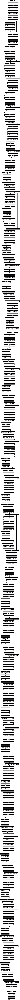

In [20]:


# Visual model
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, dpi=80)

 b) apply any potential data augmentation techniques to expand the training dataset, improving model
generalization and robustness.

Dataset Loading & Augmentation Pipeline

This function parses a single TFRecord example for training:

* **`feature_description`** defines the expected features: an encoded image and a multi-hot label vector for 11 classes.
* **Image decoding**: Converts the JPEG bytes into a normalized tensor (`float32` in \[0, 1]).
* **Resizing**: Scales the image to a fixed size `(640, 640)` to match EfficientNet's input requirement.
* **Label**: Extracts the multi-label target as a tensor of shape `(11,)`.

This prepares each image-label pair for input into your model during training or evaluation.


In [21]:
TARGET_SIZE = (640, 640)  # Fixed size for EfficientNet

def parse_example(example_proto):
    feature_description = {
        'image/encoded': tf.io.FixedLenFeature([], tf.string),
        'labels': tf.io.FixedLenFeature([11], tf.int64),  # 11-class multi-hot vector
    }
    parsed = tf.io.parse_single_example(example_proto, feature_description)

    # Decode and normalize image
    image = tf.image.decode_jpeg(parsed['image/encoded'], channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)  # [0, 1]
    image = tf.image.resize(image, TARGET_SIZE)  # Resize to match model input

    label = parsed['labels']  # shape: (11,)
    return image, label



This function applies simple data augmentation to an image during training to improve model generalization:

**random_flip_left_right**: Horizontally flips the image with a 50% chance.

**random_brightness**: Simulates varying lighting by randomly adjusting brightness.

**random_contrast**: Varies the contrast, making features more or less distinct.

**random_saturation**: Changes the intensity of colors to simulate different environments.

**random_hue**: Slightly shifts the hue (color tone), mimicking different light conditions.

The **label remains unchanged**, as it's a multi-label vector not tied to image position. This is useful when loading data with `tf.data` pipelines.


In [22]:
def augment_image(image, label):
    # Random Flip
    image = tf.image.random_flip_left_right(image)
    # Random Brightness
    image = tf.image.random_brightness(image, max_delta=0.2)
    # Random Contrast
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    # Random saturation
    image = tf.image.random_saturation(image, lower=0.8, upper=1.2)
    # Random hue
    image = tf.image.random_hue(image, max_delta=0.05)

    return image, label

Create the tf.data.Dataset Pipeline

This function loads and prepares a TFRecord dataset for training or evaluation:

* **Reads** TFRecords using `TFRecordDataset`.
* **Parses** each record into `(image, label)` using `parse_example()`.
* **Applies augmentation** if `augment=True` to improve generalization.
* **Shuffles** data for randomness.
* **Batches** data and uses **prefetching** for efficient loading during training.

It returns a ready-to-use `tf.data.Dataset` for feeding into a TensorFlow model.


In [23]:
def load_dataset(tfrecord_path, batch_size=16, augment=False):
    dataset = tf.data.TFRecordDataset(tfrecord_path)
    dataset = dataset.map(parse_example, num_parallel_calls=tf.data.AUTOTUNE)

    if augment:
        dataset = dataset.map(augment_image, num_parallel_calls=tf.data.AUTOTUNE)

    dataset = dataset.shuffle(1000)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset


This code visualizes samples from the TFRecord training dataset:

* **`id_to_class`** maps class IDs to human-readable labels.
* Loads and parses the TFRecord dataset using `parse_example`.
* **Takes 2 sample images**, decodes their multi-hot label vectors.
* Displays each image with a title listing all the **active classes** (i.e., labels with value 1).

It's useful for verifying correct image-label parsing and ensuring that multi-label annotations are working as expected.


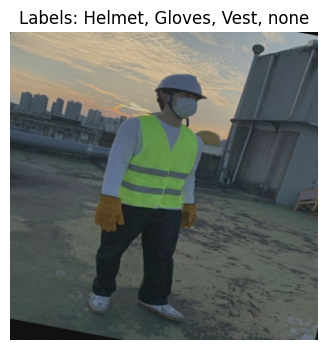

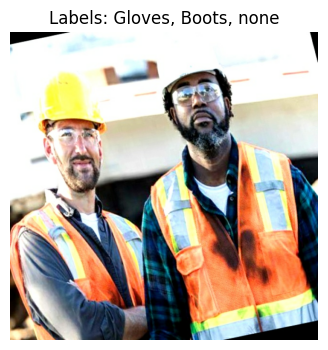

In [24]:
# Class mapping
id_to_class = {
    0: 'Helmet', 1: 'Gloves', 2: 'Vest', 3: 'Boots', 4: 'Goggles',
    5: 'none', 6: 'Person', 7: 'no_helmet', 8: 'no_goggle', 9: 'no_gloves', 10: 'no_boots'
}


# Load a few samples
tfrecord_path = 'Merged_v2/tfrecords/train.record'
dataset = tf.data.TFRecordDataset(tfrecord_path).map(parse_example)

# Show 5 samples
for i, (image, label) in enumerate(dataset.take(2)):
    multi_hot = label.numpy()
    active_classes = [id_to_class[j] for j in range(len(multi_hot)) if multi_hot[j] == 1]

    plt.figure(figsize=(4, 4))
    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title("Labels: " + ', '.join(active_classes))
    plt.show()


# Model Training

a) train the model using the prepared dataset by feeding it through your Convolutional Neural Network
(CNN). This process involves selecting appropriate hyperparameters such as learning rate, batch
size and number of epochs. Monitor the training progress using metrics like accuracy and loss and
validate the model's performance on a separate validation set to ensure it generalizes well.

Load  Training and Validation Datasets

This code loads the **training** and **validation** datasets from TFRecord files:

* **`train_dataset`**:

  * Loaded from `train.record`
  * Batch size of 16
  * **Data augmentation enabled** for training robustness

* **`val_dataset`**:

  * Loaded from `val.record`
  * Same batch size
  * **No augmentation**, ensuring accurate evaluation

Both datasets are now ready to be fed into your multi-label classification model.


In [25]:
# Update path
tfrecord_dir = 'Merged_v2/tfrecords'

train_dataset = load_dataset(
    tfrecord_path=os.path.join(tfrecord_dir, 'train.record'),
    batch_size=16,
    augment=True
)

val_dataset = load_dataset(
    tfrecord_path=os.path.join(tfrecord_dir, 'val.record'),
    batch_size=16,
    augment=False
)


Model Training

This code sets up two useful **callbacks** to improve model training:

1. **EarlyStopping**:

   * Monitors `val_loss`.
   * Stops training if validation loss doesn’t improve for 5 epochs.
   * Restores the **best model weights** to prevent overfitting.

2. **ReduceLROnPlateau**:

   * Also monitors `val_loss`.
   * If no improvement for 3 epochs, reduces the learning rate by half (`factor=0.5`).
   * Helps the model fine-tune better when progress slows.

These callbacks work together to make training more efficient and stable.


In [26]:
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)


reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    verbose=1
)


This command starts training your multi-label classification model using:

* **`train_dataset`** for learning
* **`val_dataset`** for monitoring performance
* **Up to 30 epochs**, unless early stopping halts it sooner
* **Callbacks** to:

  * Stop early if `val_loss` stops improving (`early_stopping`)
  * Reduce learning rate when training plateaus (`reduce_lr`)

The training progress, including loss and metrics per epoch, will be stored in the `history` object for later analysis or visualization.


In [27]:
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=2,
    callbacks=[early_stopping, reduce_lr]
)


Epoch 1/2
     82/Unknown 682s 8s/step - accuracy: 0.1203 - auc: 0.6803 - loss: 0.6128

/Users/chaudharysajjadhussain/Downloads/MSc_Project/mp_env/lib/python3.10/site-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


82/82 ━━━━━━━━━━━━━━━━━━━━ 920s 11s/step - accuracy: 0.1203 - auc: 0.6814 - loss: 0.6119 - val_accuracy: 0.0064 - val_auc: 0.8377 - val_loss: 0.4645 - learning_rate: 1.0000e-04
Epoch 2/2
82/82 ━━━━━━━━━━━━━━━━━━━━ 918s 11s/step - accuracy: 0.0110 - auc: 0.8309 - loss: 0.4691 - val_accuracy: 0.0064 - val_auc: 0.8388 - val_loss: 0.4560 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 2.


 b) you may use any pre-trained advanced architecture from Keras repository for this assignment.
Carefully evaluate and select the most suitable architecture based on the requirements of your task.
Provide a justification for your choice, explaining why it is appropriate for PPE classification or
detection. Once trained, save your model to an external file (e.g. with a .hdf5 or .keras extensions)
to ensure it can be reused later.

Save the Trained Model

saves **trained model** in HDF5 format (`.h5`)

* **What it includes**:

  * Model architecture
  * Weights
  * Optimizer state (for resuming training)


In [28]:
# Save the trained model as .h5
model.save('Merged_v2/ppe_detection_model_EfficientNetV2B3.h5')  # OR use .keras if preferred


This line reloads the previously saved model from the `.h5` file:

It restores:

* The **architecture**
* The **weights**
* The **optimizer state** (if any)

we can use this model for **inference**, **evaluation**, or continue **training**.


In [29]:
# Later, you can load it with:
model = tf.keras.models.load_model('Merged_v2/ppe_detection_model_EfficientNetV2B3.h5')

Accuracy & Loss Plots

 c) display a plot of the model's accuracy evaluation after training is complete, showing how accuracy
evolved over the course of the training process

This code plots the **AUC (Area Under Curve)** metric over training epochs:

* Shows both **training** and **validation** AUC.
* Helps visualize how well the model is learning to distinguish between classes over time.
* A **rising and stable validation AUC** indicates good generalization.
* The grid and legend improve readability.

It's useful for assessing model performance, especially in **multi-label or imbalanced** classification tasks.


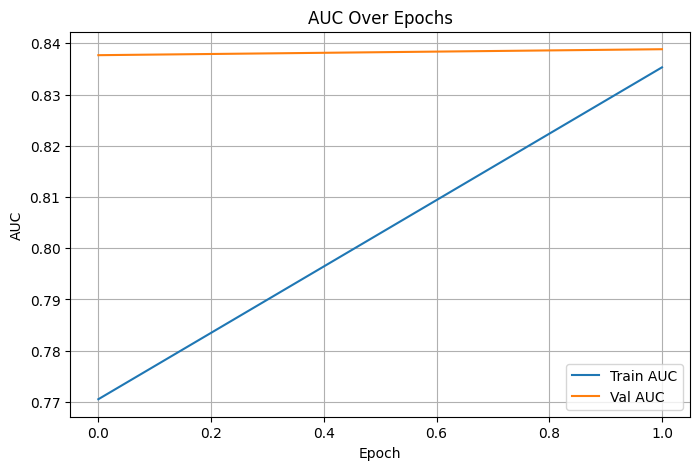

In [30]:
plt.figure(figsize=(8, 5))
plt.plot(history.history['auc'], label='Train AUC')
plt.plot(history.history['val_auc'], label='Val AUC')
plt.title('AUC Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.legend()
plt.grid(True)
plt.show()


This code plots the **accuracy** of your model over training epochs:

* Displays both **training** and **validation accuracy** curves.
* Helps you monitor learning progress and detect **overfitting** or **underfitting**.
* A good model will show both curves improving and staying close together.
* Useful for quick insight into how well your model is predicting multi-label outputs overall.


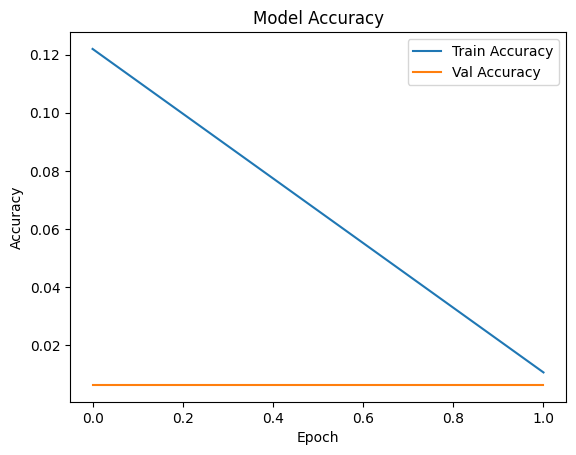

In [31]:
# Plot accuracy
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


 d) display a plot of the model's loss evaluation after training is complete, illustrating how the loss
function changed during training

This code plots the **loss curves** over training epochs:

* Shows how the **training loss** and **validation loss** evolve.
* Helps identify:

  * **Overfitting**: training loss keeps dropping while validation loss rises.
  * **Underfitting**: both losses remain high or flat.
* Ideally, both curves should **decrease and stabilize** over time.

Loss plots are essential for diagnosing training issues and fine-tuning model performance.


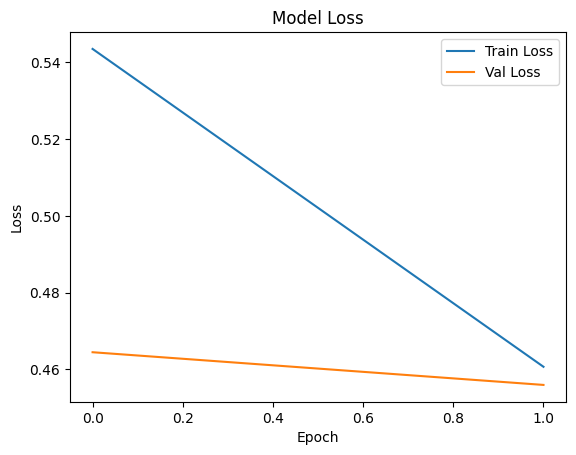

In [32]:
# Plot loss
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

#Part 3: Model Inference

Model Inference & Evaluation

 a) use your trained model to make predictions on the test set or a separate set of unseen images,
ensuring the data is properly preprocessed before feeding it into the model

This code evaluates your model on the **test dataset** and prepares predictions for performance metrics:

### Steps:

* **Loads the test dataset** with the same preprocessing logic, no augmentation.
* Iterates through test samples (batch size = 1 for per-image predictions).
* **Generates predictions** using the trained model.
* Applies a **threshold of 0.5** to convert sigmoid outputs to binary class predictions.
* Collects:

  * `y_true`: actual multi-label ground truths
  * `y_pred`: predicted binary labels

These arrays are now ready for computing evaluation metrics like **accuracy, precision, recall, F1-score, confusion matrix**, etc.


In [33]:
# Load test dataset (use same resize & parse logic)
test_dataset = load_dataset(
    tfrecord_path='Merged_v2/tfrecords/test.record',
    batch_size=1,
    augment=False
)

y_true = []
y_pred = []

for images, labels in test_dataset:
    preds = model.predict(images)

    y_true.extend(labels.numpy())
    y_pred.extend((preds > 0.5).astype(int))  # Threshold at 0.5



1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 841ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 975ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 958ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 990ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 998ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 837ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━

b) calculate and report key performance metrics such as accuracy, precision, recall, F1 score or
confusion matrix to assess the model's classification or detection capabilities

This code generates a detailed **multi-label classification report** using scikit-learn:

### Output Includes:

* **Precision**, **Recall**, **F1-score**, and **Support** for each of the 11 PPE-related classes.
* Evaluates model performance **per class**, which is crucial in multi-label setups where different labels may have imbalanced occurrences.
* `target_names` maps class indices to readable names using `id_to_class`.
* `digits=4` shows results with 4 decimal precision.
* `zero_division=0` avoids warnings for classes with no predicted or true samples.

This report helps identify which classes the model performs well on and where improvements are needed.


In [34]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix

print("📋 Multi-label Classification Report:")
print(classification_report(
    y_true,
    y_pred,
    target_names=[id_to_class[i] for i in range(11)],
    digits=4,
    zero_division=0
))


📋 Multi-label Classification Report:
              precision    recall  f1-score   support

      Helmet     0.0000    0.0000    0.0000       134
      Gloves     0.7239    1.0000    0.8398       194
        Vest     0.0000    0.0000    0.0000       115
       Boots     0.0000    0.0000    0.0000        96
     Goggles     0.0000    0.0000    0.0000        85
        none     0.9440    1.0000    0.9712       253
      Person     0.0000    0.0000    0.0000        57
   no_helmet     0.0000    0.0000    0.0000        52
   no_goggle     0.0000    0.0000    0.0000        48
   no_gloves     0.0000    0.0000    0.0000         7
    no_boots     0.0000    0.0000    0.0000         0

   micro avg     0.8340    0.4294    0.5669      1041
   macro avg     0.1516    0.1818    0.1646      1041
weighted avg     0.3643    0.4294    0.3925      1041
 samples avg     0.8340    0.5096    0.6024      1041



This code prints **individual confusion matrices** for each of the 11 classes in your multi-label classification task:

### What it does:

* Uses `multilabel_confusion_matrix()` to compute a **2x2 matrix per class**, treating each as a separate binary classification problem.
* For each class (e.g., Helmet, Gloves, etc.), it shows:

  ```
  [[TN FP]
   [FN TP]]
  ```

  * **TN**: True Negatives
  * **FP**: False Positives
  * **FN**: False Negatives
  * **TP**: True Positives

### Why it's useful:

* Helps diagnose **specific class-level issues**, like whether a class is under-predicted or over-predicted.
* Essential when classes are imbalanced or have different error costs.

looping through all classes and printing their names with their corresponding confusion matrix — great for debugging and performance insights.


In [35]:
# Optional: per-class confusion matrices
conf_matrices = multilabel_confusion_matrix(y_true, y_pred)

# Visualize one (e.g. class 0 = Helmet)
#class_index = 0
for id,class_ in id_to_class.items():
  print(id,class_)

  print(f"Confusion matrix for: {id_to_class[id]}")
  print(conf_matrices[id])
  print("-"*100)


0 Helmet
Confusion matrix for: Helmet
[[134   0]
 [134   0]]
----------------------------------------------------------------------------------------------------
1 Gloves
Confusion matrix for: Gloves
[[  0  74]
 [  0 194]]
----------------------------------------------------------------------------------------------------
2 Vest
Confusion matrix for: Vest
[[153   0]
 [115   0]]
----------------------------------------------------------------------------------------------------
3 Boots
Confusion matrix for: Boots
[[172   0]
 [ 96   0]]
----------------------------------------------------------------------------------------------------
4 Goggles
Confusion matrix for: Goggles
[[183   0]
 [ 85   0]]
----------------------------------------------------------------------------------------------------
5 none
Confusion matrix for: none
[[  0  15]
 [  0 253]]
----------------------------------------------------------------------------------------------------
6 Person
Confusion matrix for: Perso

 c) select a set of sample images from the test set and overlay the model's predictions (e.g. class
labels or bounding boxes for detected PPE) on the images to clearly illustrate how well the model
performs

d) for a subset of predictions, compare the model’s output with the ground truth to highlight any
misclassifications or detection errors. Discuss potential reasons for these discrepancies

This code visualizes **model predictions vs. ground truth** for 5 test images:

### What it does:

* Takes 5 images from the test dataset.
* **Predicts labels** using the trained model.
* Converts model outputs and ground truths into **human-readable class names** using `id_to_class`.
* Displays each image with:

  * **Predicted classes** (based on threshold > 0.5)
  * **Actual classes** (from the multi-hot label vector)

### Why it's useful:

* Quickly shows whether the model is making correct multi-label predictions.
* Helps spot patterns in **false positives or false negatives** visually.
* Good for debugging and qualitative evaluation.

A helpful tool to complement your quantitative metrics like F1-score and confusion matrices.


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


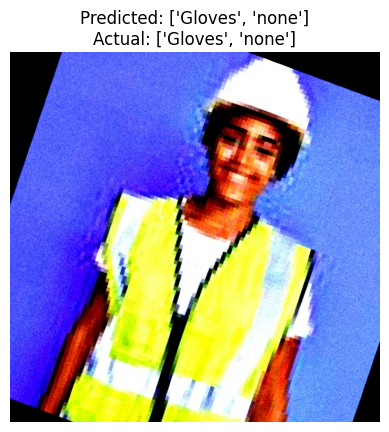

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 849ms/step


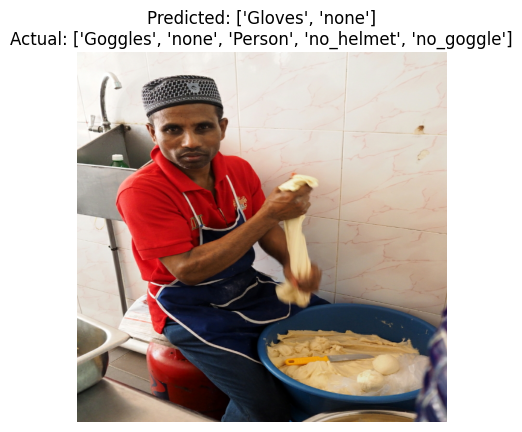

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


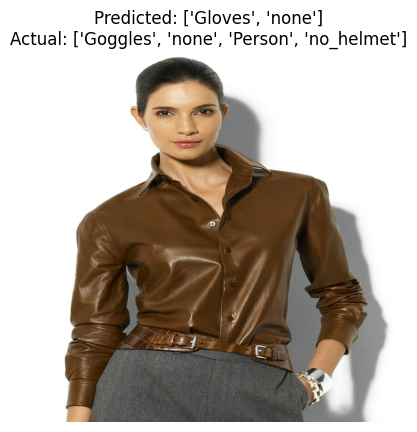

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 803ms/step


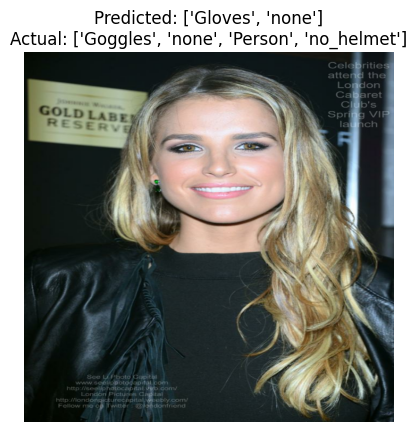

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


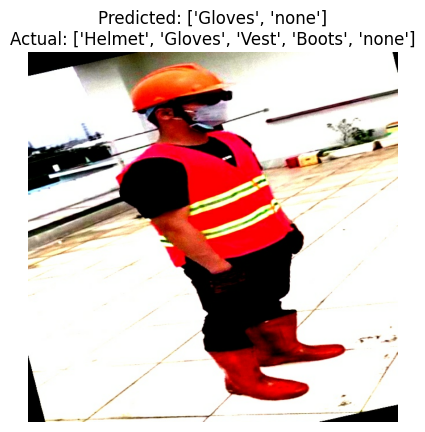

In [36]:
for image, label in test_dataset.take(5):
    pred = model.predict(image)
    pred_classes = [id_to_class[i] for i, p in enumerate(pred[0]) if p > 0.5]
    true_classes = [id_to_class[i] for i, v in enumerate(label[0].numpy()) if v == 1]

    plt.imshow(image[0].numpy())
    plt.axis('off')
    plt.title(f"Predicted: {pred_classes}\nActual: {true_classes}")
    plt.show()


This code processes and displays the **class distribution** from your training set to understand data imbalance:

### Breakdown:

* `class_counter` holds the count of instances per class (previously computed).
* It's sorted by class ID to maintain consistent order.
* Then, it prints the number of instances per class for a clearer overview.
* `class_counts` extracts only the count values into a list, which can be used to compute class weights.

```

This is often used to compute **class weights** for handling imbalance during training (e.g., using `class_weight.compute_class_weight` or custom loss adjustment).


In [37]:
from collections import Counter
from sklearn.utils import class_weight

# Sort by class ID (the keys)
class_counts_sorted = dict(sorted(class_counter.items()))

# Print neatly
for class_id, count in class_counts_sorted.items():
    print(f"Class {class_id}: {count} instances")


class_counts = list(class_counts_sorted.values())

class_counts

Class 0: 1612 instances
Class 1: 1338 instances
Class 2: 1508 instances
Class 3: 1475 instances
Class 4: 482 instances
Class 5: 733 instances
Class 6: 2078 instances
Class 7: 445 instances
Class 8: 373 instances
Class 9: 502 instances
Class 10: 99 instances


[1612, 1338, 1508, 1475, 482, 733, 2078, 445, 373, 502, 99]

# Focal Loss + Fine-Tuning + AUC Tracking for Multi-Label Classification



---

## **1. Focal Loss (Multi-label Version)**

```python
def focal_loss_multilabel_tuned_v1(gamma=2., alpha=0.25):
```

* Regular binary cross-entropy can be dominated by **easy or frequent classes**.
* **Focal Loss** reduces the weight of well-classified examples and focuses learning on harder, misclassified examples.
* Works well in multi-label setups (like multiple PPE items per image).
* `alpha`: balances importance of positive vs. negative labels (e.g., rare PPE violations).
* `gamma`: focusing parameter; higher values = more focus on hard examples.

**Result**: Better performance on rare or hard-to-predict classes.

---

## **2. AUC Metric**

```python
auc_metrics_tuned_v1 = [tf.keras.metrics.AUC(name='auc')]
```

* AUC evaluates how well the model ranks positive labels higher than negative ones.
* Useful when data is imbalanced — better than just accuracy.
* It gives a more holistic view of model performance per class.

---

## **3. Model Architecture**

### **Backbone: EfficientNetV2B3**

```python
base_model_tuned_v1 = EfficientNetV2B3(include_top=False, weights='imagenet')
base_model_tuned_v1.trainable = False
```

* A powerful pretrained CNN that extracts meaningful image features.
* Set to **non-trainable** initially to retain ImageNet knowledge and speed up early training.
* can **fine-tune later** after initial training for better results.

---

### **Custom Classification Head**

```python
x_tuned_v1 = GlobalAveragePooling2D()(base_model.output)
x_tuned_v1 = Dropout(0.3)(x_tuned_v1)
x_tuned_v1 = Dense(256, activation='relu')(x_tuned_v1)
x_tuned_v1 = BatchNormalization()(x_tuned_v1)
x_tuned_v1 = Dropout(0.3)(x_tuned_v1)
x_tuned_v1 = Dense(128, activation='relu')(x_tuned_v1)
x_tuned_v1 = Dropout(0.2)(x_tuned_v1)
output = Dense(11, activation='sigmoid')(x_tuned_v1)
```

Each part has a role:

| Layer                       | Purpose                                                               |
| --------------------------- | --------------------------------------------------------------------- |
| `GlobalAveragePooling2D`    | Reduces spatial features to vector — model-size independent           |
| `Dense(256)` & `Dense(128)` | Learn high-level task-specific patterns from extracted features       |
| `BatchNormalization()`      | Stabilizes and accelerates training                                   |
| `Dropout`                   | Prevents overfitting by randomly dropping neurons during training     |
| `Dense(11, sigmoid)`        | Outputs 11 independent probabilities (for multi-label classification) |

**Sigmoid** is used because each class is **independent**, unlike softmax (used for mutually exclusive classes).

---

## **Overall Goal**

Building a **robust, generalizable, and imbalance-aware multi-label classifier** for PPE detection. This architecture is well-suited for real-world data where:

* Multiple labels can exist per image (helmet, vest, gloves, etc.)
* Some labels (like violations) are rare and need special focus
* Image sizes vary (model handles that with `None, None, 3`)

---

In [38]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.applications import EfficientNetV2B3
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# === Step 1: Focal Loss for Multi-Label Classification ===
def focal_loss_multilabel_tuned_v1(gamma=2., alpha=0.25):
    def loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        pt = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
        return -tf.reduce_mean(alpha * tf.pow(1. - pt, gamma) * tf.math.log(pt))
    return loss

# === Step 2: AUC Metrics (Per Class) ===
auc_metrics_tuned_v1 =[tf.keras.metrics.AUC(name='auc')]

# === Step 3: Build the Model ===
input_tensor_tuned_v1 = tf.keras.Input(shape=(None, None, 3))
base_model_tuned_v1 = EfficientNetV2B3(include_top=False, weights='imagenet', input_tensor=input_tensor_tuned_v1)
base_model_tuned_v1.trainable = False  # Freeze for initial training

x_tuned_v1 = GlobalAveragePooling2D()(base_model_tuned_v1.output)
x_tuned_v1 = Dropout(0.3)(x_tuned_v1)
x_tuned_v1 = Dense(256, activation='relu')(x_tuned_v1)
x_tuned_v1 = BatchNormalization()(x_tuned_v1)
x_tuned_v1 = Dropout(0.3)(x_tuned_v1)
x_tuned_v1 = Dense(128, activation='relu')(x_tuned_v1)
x_tuned_v1 = Dropout(0.2)(x_tuned_v1)
output_tuned_v1 = Dense(11, activation='sigmoid')(x_tuned_v1)

model_tuned_v1 = Model(inputs=input_tensor_tuned_v1, outputs=output_tuned_v1)


In [39]:
# Text summary
model_tuned_v1.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, None,      │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_1     │ (None, None,      │          0 │ rescaling_1[0][0] │
│ (Normalization)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │      1,080 │ normalization_1[… │
│                     │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        160 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      5,760 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, None,      │      2,304 │ block1a_project_… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, None,      │         64 │ block1b_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, None,      │          0 │ block1b_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, None,      │          0 │ block1b_project_… │
│ (Dropout)           │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, None,      │          0 │ block1b_drop[0][… │
│                     │ None, 16)         │            │ block1a_project_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b

 Total params: 13,359,433 (50.96 MB)

 Trainable params: 428,299 (1.63 MB)

 Non-trainable params: 12,931,134 (49.33 MB)

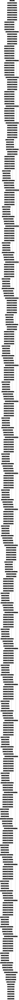

In [40]:
# Visual model
from tensorflow.keras.utils import plot_model
plot_model(model_tuned_v1, show_shapes=True, dpi=80)

This code launches the **initial training phase** of  **enhanced multi-label model**, using focal loss and training callbacks for improved learning control.


---

#### **Step 4: Compile with Focal Loss**

```python
model_tuned_v1.compile(
    optimizer=Adam(1e-4),
    loss=focal_loss_multilabel_tuned_v1(),
    metrics=['accuracy', AUC]
)
```

* Uses **Adam optimizer** with a learning rate of `1e-4`.
* Applies your **custom focal loss**, ideal for handling class imbalance in multi-label data.
* Tracks both **accuracy** and **AUC**, giving insights into model performance.

---

#### **Step 5: Callbacks**

```python
early_stop_tuned_v1 = EarlyStopping(...)
reduce_lr_tuned_v1 = ReduceLROnPlateau(...)
```

* **EarlyStopping** halts training early if `val_loss` doesn't improve for 5 epochs.
* **ReduceLROnPlateau** cuts the learning rate by half if `val_loss` stagnates for 2 epochs.
* Helps prevent overfitting and encourages convergence during plateaus.

---

#### **Step 6: Initial Training**

```python
history_tuned_v1 = model_tuned_v1.fit(...)
```

* Trains the model on your **training dataset**, validating against the validation set.
* Runs for **up to 30 epochs**, but may stop earlier due to `EarlyStopping`.
* All training metrics are stored in `history_tuned_v1` for plotting and evaluation.

---

### Summary:

Training a **well-regularized**, **imbalance-aware**, and **generalizable** PPE detection model. The use of focal loss, dropout, batch norm, and smart callbacks makes it resilient to overfitting and class imbalance.


In [41]:
# === Step 4: Compile Model with Focal Loss ===
optimizer_tuned_v1 = Adam(learning_rate=1e-4)
model_tuned_v1.compile(optimizer=optimizer_tuned_v1,
                       loss=focal_loss_multilabel_tuned_v1(),
                       metrics=['accuracy'] + auc_metrics_tuned_v1)

# === Step 5: Callbacks ===
early_stop_tuned_v1 = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
reduce_lr_tuned_v1 = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1, min_lr=1e-6)


# === Step 6: Initial Training Phase ===
history_tuned_v1 = model_tuned_v1.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=2,
    callbacks=[early_stop_tuned_v1, reduce_lr_tuned_v1]
)

Epoch 1/2
     82/Unknown 1353s 16s/step - accuracy: 0.1183 - auc: 0.5403 - loss: 0.0911

/Users/chaudharysajjadhussain/Downloads/MSc_Project/mp_env/lib/python3.10/site-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


82/82 ━━━━━━━━━━━━━━━━━━━━ 1824s 21s/step - accuracy: 0.1183 - auc: 0.5405 - loss: 0.0910 - val_accuracy: 0.5172 - val_auc: 0.6811 - val_loss: 0.0413 - learning_rate: 1.0000e-04
Epoch 2/2
82/82 ━━━━━━━━━━━━━━━━━━━━ 1751s 21s/step - accuracy: 0.1192 - auc: 0.6077 - loss: 0.0658 - val_accuracy: 0.5150 - val_auc: 0.7561 - val_loss: 0.0397 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 2.


# Fine-Tuning Phase (unfreeze top layers)

This block initiates the **fine-tuning phase** of model after initial training, allowing deeper layers of EfficientNetV2B3 to adapt to your PPE dataset.

---

#### **Unfreezing Top Layers**

```python
base_model_tuned_v1.trainable = True
for layer in base_model_tuned_v1.layers[:200]:
    layer.trainable = False
```

* First, the **entire base model is made trainable**.
* Then, the **bottom 200 layers remain frozen**, allowing only the **top layers** (closer to output) to learn PPE-specific features.
* This helps fine-tune **task-relevant features** without overwriting general ones.

---

#### **Recompilation for Fine-Tuning**

```python
model_tuned_v1.compile(optimizer=Adam(1e-5), ...)
```

* A smaller learning rate (`1e-5`) is used to **gently update** pretrained weights.
* Same **focal loss** and **metrics** are kept for consistency.

---

#### **Fine-Tuning Training Loop**

```python
history_ft_tuned_v2 = model_tuned_v1.fit(...)
```

* Re-trains the model using both **train** and **validation** sets.
* Reuses the **early stopping and learning rate reduction callbacks**.
* Captures fine-tuning metrics in `history_ft_tuned_v2`.

---

### **Why This Matters**

* Improves model **generalization and accuracy**, especially when pretrained features alone aren’t enough.
* Allows the model to learn subtle dataset-specific features (e.g., helmet variations, lighting, camera angles).
* Maintains a balance between **preserving pretraining** and **adapting to new data**.



In [ ]:
# === Step 7: Fine-Tuning Phase (unfreeze top layers) ===
base_model_tuned_v1.trainable = True
for layer in base_model_tuned_v1.layers[:200]:  # optionally freeze bottom layers
    layer.trainable = False

model_tuned_v1.compile(optimizer=Adam(1e-5),
                       loss=focal_loss_multilabel_tuned_v1(),
                       metrics=['accuracy'] + auc_metrics_tuned_v1)

history_ft_tuned_v2 = model_tuned_v1.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=2,
    callbacks=[early_stop_tuned_v1, reduce_lr_tuned_v1]
)

Epoch 1/2


This command saves **fine-tuned model** to disk without the optimizer or loss function:

---

### Why `include_optimizer=False`?

* **Avoids serialization issues**, especially with **custom losses** like your focal loss.
* Makes the model **lighter** and safer to reload later — you can define and recompile with the custom loss manually, as you did earlier.
* Ideal when you only need the model for **inference** or future **evaluation**, not to resume training immediately.

---



In [ ]:

# Save model without optimizer or loss (avoids serialization issues)
model_tuned_v1.save(
    'Merged_v2/model_tuned_v1_fine_tune_EfficientNetV2B3.h5',
    include_optimizer=False  # this is crucial
)



c) display a plot of the model's accuracy evaluation after training is complete, showing how accuracy
evolved over the course of the training process

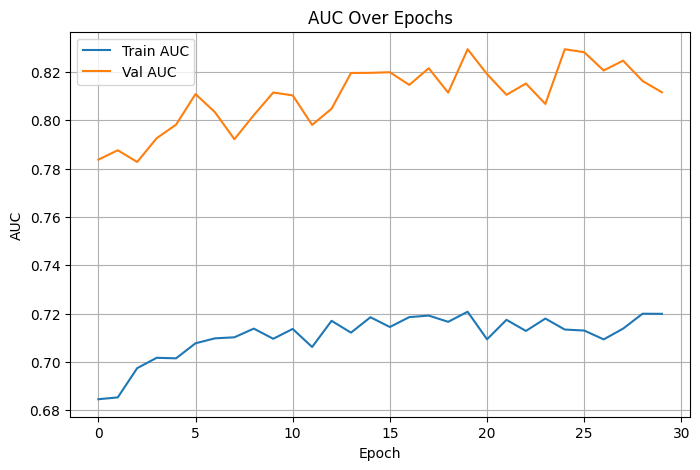

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(history_ft_tuned_v2.history['auc'], label='Train AUC')
plt.plot(history_ft_tuned_v2.history['val_auc'], label='Val AUC')
plt.title('AUC Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.legend()
plt.grid(True)
plt.show()


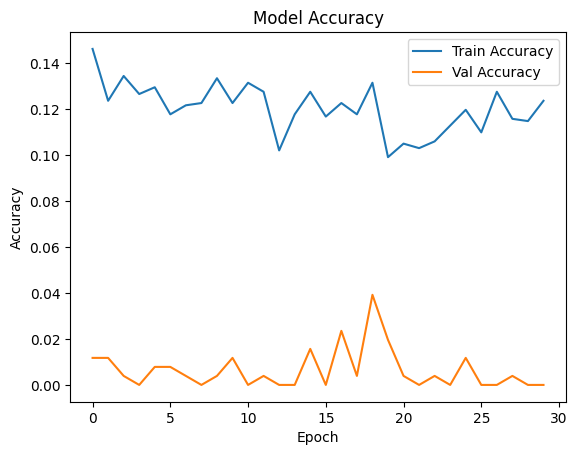

In [ ]:
# Plot accuracy
plt.plot(history_ft_tuned_v2.history['accuracy'], label='Train Accuracy')
plt.plot(history_ft_tuned_v2.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

d) display a plot of the model's loss evaluation after training is complete, illustrating how the loss
function changed during training

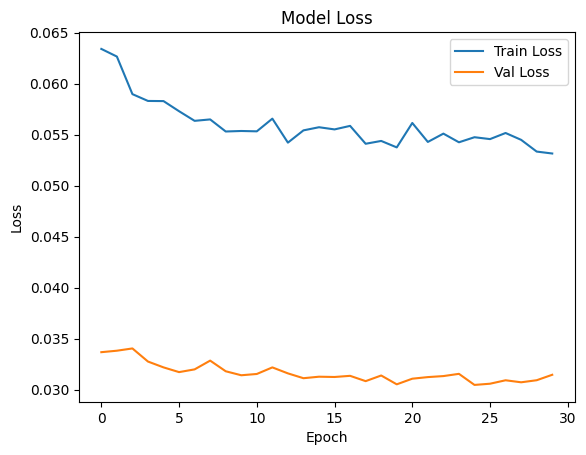

In [ ]:
# Plot loss
plt.plot(history_ft_tuned_v2.history['loss'], label='Train Loss')
plt.plot(history_ft_tuned_v2.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Model Inference

---


 a) use your trained model to make predictions on the test set or a separate set of unseen images,
ensuring the data is properly preprocessed before feeding it into the model

This code safely **reloads and recompiles** fine-tuned multi-label model saved with a custom loss (focal loss):


---

#### **Load Without Compiling**

```python
compile=False
```

* Prevents TensorFlow from trying to load the unknown `focal_loss_multilabel_tuned_v1` immediately.
* Allows you to manually define and reattach the custom components afterward.

---

#### **Redefine Focal Loss**

```python
def focal_loss_multilabel_tuned_v1(...):
```

* Re-creates the exact loss function so it can be attached after loading.
* Required since `load_model()` doesn't save the function code itself.

---

#### **Recompile Model**

```python
model.compile(...)
```

* Uses a **low learning rate** (`1e-5`) for safe continued training or evaluation.
* Re-attaches the **focal loss** and **metrics** (`accuracy`, `AUC`) to make the model fully functional again.

---

### Result

Model is now:

* Fully restored
* Ready to **evaluate**, **predict**, or **continue training** seamlessly.



In [ ]:
# Reload without compiling
model_tuned_fine_tune = tf.keras.models.load_model(
    'Merged_v2/model_tuned_v1_fine_tune_EfficientNetV2B3.h5',
    compile=False  # skip trying to deserialize custom loss
)

# Define focal loss again
def focal_loss_multilabel_tuned_v1(gamma=2., alpha=0.25):
    def loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        pt = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
        return -tf.reduce_mean(alpha * tf.pow(1. - pt, gamma) * tf.math.log(pt))
    return loss

# Recompile after loading

model_tuned_fine_tune.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss=focal_loss_multilabel_tuned_v1(),
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)


This code evaluates the **fine-tuned model** on the test set by collecting predictions and ground truths:

---

### What it does:

* **Loops through the test dataset**, one batch at a time.
* Uses the **fine-tuned model** (`model_tuned_fine_tune`) to predict outputs.
* Applies a **threshold of 0.5** to convert sigmoid probabilities into binary predictions (`1` for presence, `0` for absence).
* Stores:

  * `y_true_tuned_v2`: actual multi-label ground truths
  * `y_pred_tuned_v2`: predicted labels after thresholding

---

### Purpose:

This prepares your data for:

* **Classification report**
* **Confusion matrices**
* **Precision, recall, F1-score**
* **Custom visualizations**

In [ ]:
y_true_tuned_v2 = []
y_pred_tuned_v2 = []

for images, labels in test_dataset:
    preds_tuned_v2 = model_tuned_fine_tune.predict(images)

    y_true_tuned_v2.extend(labels.numpy())
    y_pred_tuned_v2.extend((preds_tuned_v2 > 0.5).astype(int))  # Threshold at 0.5

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━

b) calculate and report key performance metrics such as accuracy, precision, recall, F1 score or
confusion matrix to assess the model's classification or detection capabilities

This code generates a detailed **multi-label classification report** for **fine-tuned model's predictions** (`y_pred_tuned_v2`) against the ground truth (`y_true_tuned_v2`):

---

### **Output Includes for Each Class**:

* **Precision**: How many predicted positives were correct.
* **Recall**: How many actual positives were correctly predicted.
* **F1-score**: Harmonic mean of precision and recall.
* **Support**: Number of true instances for each class.

---

### Additional Notes:

* `target_names` provides human-readable class labels using `id_to_class`.
* `digits=4` ensures high-precision metric output.
* `zero_division=0` avoids errors when there are no true or predicted instances for a class.

This report is critical for evaluating which PPE classes (e.g., helmet, gloves, no\_goggles) are predicted well and where the model needs improvement.




In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix

print("Multi-label Classification Report:")
print(classification_report(
    y_true_tuned_v2,
    y_pred_tuned_v2,
    target_names=[id_to_class[i] for i in range(11)],
    digits=4,
    zero_division=0
))

Multi-label Classification Report:
              precision    recall  f1-score   support

      Helmet     0.4737    0.6522    0.5488        69
      Gloves     0.7482    0.9811    0.8490       106
        Vest     0.4211    0.1379    0.2078        58
       Boots     0.5714    0.1600    0.2500        50
     Goggles     0.2500    0.0952    0.1379        42
        none     0.9296    1.0000    0.9635       132
      Person     0.0000    0.0000    0.0000        25
   no_helmet     0.0000    0.0000    0.0000        22
   no_goggle     0.0000    0.0000    0.0000        18
   no_gloves     0.0000    0.0000    0.0000         1
    no_boots     0.0000    0.0000    0.0000         0

   micro avg     0.7082    0.5755    0.6350       523
   macro avg     0.3085    0.2751    0.2688       523
weighted avg     0.5702    0.5755    0.5457       523
 samples avg     0.7208    0.6501    0.6389       523



This code prints **individual confusion matrices** for each of the 11 PPE-related classes, helping you analyze the **fine-tuned model's** predictions class by class.

---

### What It Does:

* Uses `multilabel_confusion_matrix()` to compute a separate **2x2 confusion matrix** for each class.

* Each matrix is of the form:

  ```
  [[TN, FP],
   [FN, TP]]
  ```

  * **TN**: True Negatives
  * **FP**: False Positives
  * **FN**: False Negatives
  * **TP**: True Positives

* Iterates through `id_to_class` to print class names alongside their matrices.

---

### Why It's Useful:

* Gives **clear insight into per-class performance**.
* Helps detect:

  * Classes with many **false positives** (model over-predicts them)
  * Classes with many **false negatives** (model under-predicts them)
* Essential for diagnosing class imbalance or challenging labels (e.g., `no_helmet`, `no_goggles`).


In [ ]:
# Optional: per-class confusion matrices
conf_matrices_tuned_v2 = multilabel_confusion_matrix(y_true_tuned_v2, y_pred_tuned_v2)

# Visualize one (e.g. class 0 = Helmet)
#class_index = 0
for id,class_ in id_to_class.items():
  print(id,class_)

  print(f"Confusion matrix for: {id_to_class[id]}")
  print(conf_matrices_tuned_v2[id])
  print("-"*100)


0 Helmet
Confusion matrix for: Helmet
[[23 50]
 [24 45]]
----------------------------------------------------------------------------------------------------
1 Gloves
Confusion matrix for: Gloves
[[  1  35]
 [  2 104]]
----------------------------------------------------------------------------------------------------
2 Vest
Confusion matrix for: Vest
[[73 11]
 [50  8]]
----------------------------------------------------------------------------------------------------
3 Boots
Confusion matrix for: Boots
[[86  6]
 [42  8]]
----------------------------------------------------------------------------------------------------
4 Goggles
Confusion matrix for: Goggles
[[88 12]
 [38  4]]
----------------------------------------------------------------------------------------------------
5 none
Confusion matrix for: none
[[  0  10]
 [  0 132]]
----------------------------------------------------------------------------------------------------
6 Person
Confusion matrix for: Person
[[117   0]
 [ 



### **Goal**

The goal is to **visually analyze** how **fine-tuned model** performs on each of the 11 classes in your multi-label PPE detection task.

---

### **What Is a Confusion Matrix?**

For each class (e.g., "Helmet"), the confusion matrix is a 2×2 grid showing:

|                 | **Predicted: No**   | **Predicted: Yes**  |
| --------------- | ------------------- | ------------------- |
| **Actual: No**  | True Negative (TN)  | False Positive (FP) |
| **Actual: Yes** | False Negative (FN) | True Positive (TP)  |

This shows:

* **TP**: Correctly predicted present
* **TN**: Correctly predicted absent
* **FP**: Predicted present when it wasn't
* **FN**: Missed a class that was actually there

---

### **What the Code Does**

#### 1. **`plot_confusion_matrix()`**

* Takes a confusion matrix and the class name.
* Uses `seaborn.heatmap()` to make a clear, colored grid.
* Labels axes for readability (Actual vs. Predicted).
* Annotates each cell with the actual numbers.

#### 2. **Loop Through All Classes**

* For each class (`Helmet`, `Gloves`, `no_helmet`, etc.), it plots its own matrix.
* Helps you analyze how well the model detects **each individual class**.

---

### **Why It’s Useful**

* **Instant insights**: You can quickly spot which classes are being predicted poorly.
* **False positives and negatives** stand out visually.
* Helps in **debugging** and deciding where to apply data augmentation, collect more data, or adjust thresholds.

---





In [3]:
!pip install -q seaborn

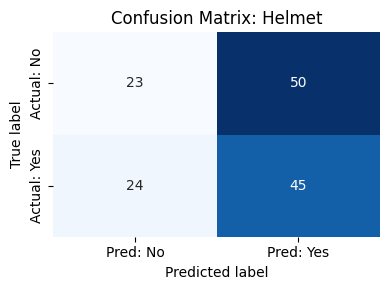

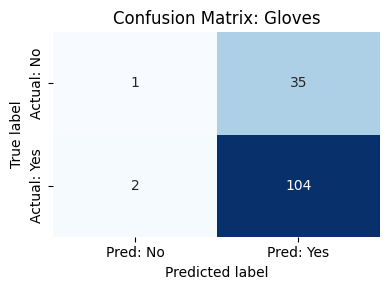

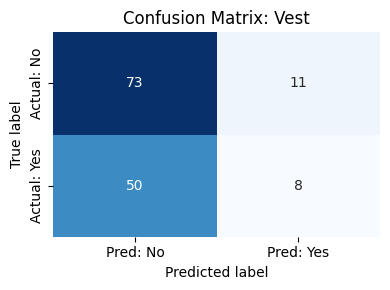

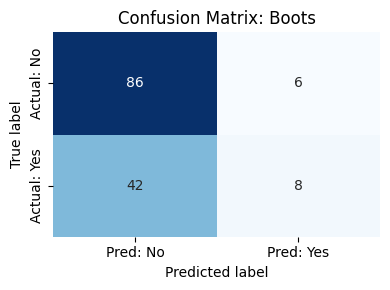

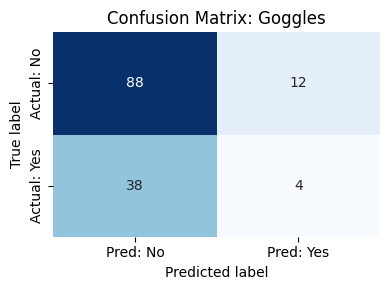

...

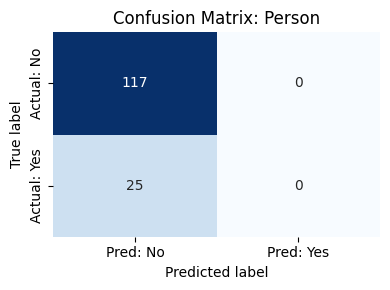

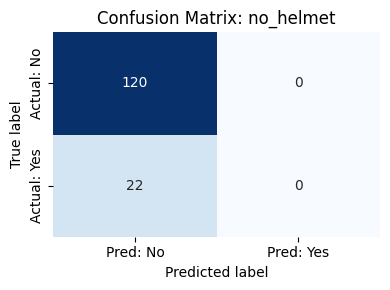

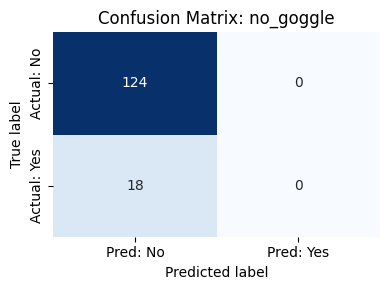

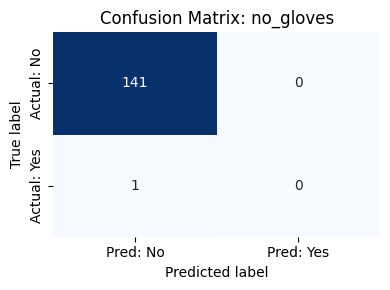

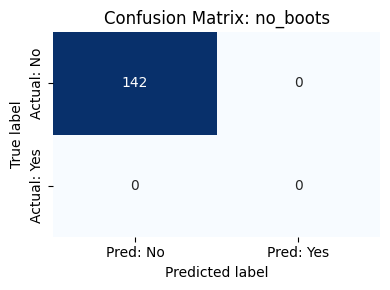

In [ ]:
import seaborn as sns

def plot_confusion_matrix(cm, class_name):
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=["Pred: No", "Pred: Yes"],
                yticklabels=["Actual: No", "Actual: Yes"])
    plt.title(f'Confusion Matrix: {class_name}')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

# Plot heatmaps for each class
for class_id, class_name in id_to_class.items():
    cm = conf_matrices_tuned_v2[class_id]
    plot_confusion_matrix(cm, class_name)


## **Goal**

To identify which **classes the model struggles with**, by looking at:

1. **False Positives (FP)** — the model predicted a class when it **wasn't actually there**
   → Example: The model says "no\_gloves" but the person is wearing gloves.

2. **False Negatives (FN)** — the model **missed a class** that was actually present
   → Example: The person isn’t wearing a helmet, but the model didn’t detect "no\_helmet".

---

## **What the Code Does**

### Loop through all classes (e.g., Helmet, Person, no\_gloves...)

For each one:

* It gets the **confusion matrix**, which looks like:

  ```
  [[TN, FP],
   [FN, TP]]
  ```
* Then it prints:

  * How many times the model made **false positives** (over-predicting).
  * How many times it made **false negatives** (missed detections).
  * A **warning icon ** if either of those errors is high (e.g., >10 times).

### Example Output:

```
Class: no_gloves
  False Positives: 28 — predicted 'no_gloves' when it wasn't present.
  False Negatives: 37 — missed 'no_gloves' when it was actually present.
  High Error: Investigate this class further.
```

This highlights that **“no\_gloves” is a problem class**, and you might want to:

* Add more examples to the training set
* Check if annotation quality is poor
* Add data augmentation or tweak the loss function

---

## **Why This Is Useful**

* It gives you **a quick summary of where the model makes the most mistakes**, per class.
* Helps you focus your debugging efforts:

  * Is the model too sensitive? (high FP)
  * Is it missing important violations? (high FN)
* This is **especially useful in safety-critical tasks** like PPE detection, where missing a “no\_helmet” is much worse than a small false alarm.

---



In [ ]:
# Print a summary of FP and FN per class
print("Common Mistakes (False Positives & False Negatives):\n")

for class_id, class_name in id_to_class.items():
    cm = conf_matrices_tuned_v2[class_id]
    tn, fp, fn, tp = cm.ravel()

    print(f"Class: {class_name}")
    print(f"  False Positives: {fp} — predicted '{class_name}' when it wasn't present.")
    print(f"  False Negatives: {fn} — missed '{class_name}' when it was actually present.")

    # Highlight potentially problematic classes
    if fp > 10 or fn > 10:  # threshold can be adjusted
        print(" High Error: Need to Investigate this class further.")

    print("-" * 60)


Common Mistakes (False Positives & False Negatives):

Class: Helmet
  False Positives: 50 — predicted 'Helmet' when it wasn't present.
  False Negatives: 24 — missed 'Helmet' when it was actually present.
 High Error: Need to Investigate this class further.
------------------------------------------------------------
Class: Gloves
  False Positives: 35 — predicted 'Gloves' when it wasn't present.
  False Negatives: 2 — missed 'Gloves' when it was actually present.
 High Error: Need to Investigate this class further.
------------------------------------------------------------
Class: Vest
  False Positives: 11 — predicted 'Vest' when it wasn't present.
  False Negatives: 50 — missed 'Vest' when it was actually present.
 High Error: Need to Investigate this class further.
------------------------------------------------------------
Class: Boots
  False Positives: 6 — predicted 'Boots' when it wasn't present.
  False Negatives: 42 — missed 'Boots' when it was actually present.
 High Error



### **Objective**

To visually **highlight which classes** your model is struggling with — directly in the confusion matrix grid — using color cues.

---

### **How It Works**

For each class (like `Helmet`, `no_gloves`, etc.), you already have a **2x2 confusion matrix**:

|                 | **Pred: No**   | **Pred: Yes**  |
| --------------- | -------------- | -------------- |
| **Actual: No**  | TN (True Neg)  | FP (False Pos) |
| **Actual: Yes** | FN (False Neg) | TP (True Pos)  |

The code extracts these 4 values:

```python
tn, fp, fn, tp = cm.ravel()
```

Then it checks:

* **Is FP or FN > 10?**
  → If yes, it's a **high-error class** → show title in **red**
* **Is FP or FN > 0?**
  → If yes, it's a **moderate-error class** → show title in **orange**
* **If both FP and FN == 0**
  → Perfect predictions → show title in **green**

---

### **Visual Cues in the Grid**

| Color     | Meaning                           |
| --------- | --------------------------------- |
| 🔴 Red    | High error → lots of mistakes     |
| 🟠 Orange | Some mistakes (moderate issue)    |
| 🟢 Green  | No mistakes → perfect predictions |

This lets you **instantly see** which classes your model:

* **Over-predicts** (high FP)
* **Under-predicts** (high FN)
* **Handles well** (green = safe)

---

### **Why This Is Helpful**

* **Faster diagnosis**: You don’t have to read numbers—color does the work.
* **Prioritize fixes**: Focus your improvement efforts on red-labeled classes.
* **Better reporting**: Clean and intuitive visual for presentations or analysis.
* **Multi-label friendly**: Since it shows performance per class, it works perfectly for your PPE detection task.



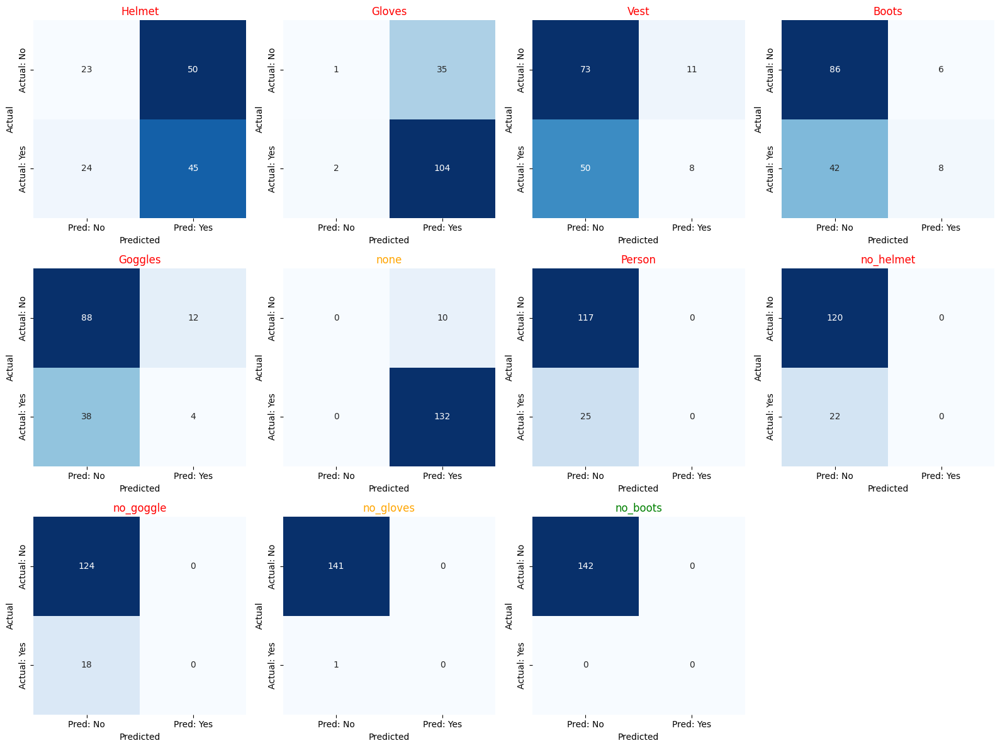

In [ ]:
def plot_confusion_matrix_grid_colored(conf_matrices, class_names, cols=4, fp_threshold=10, fn_threshold=10):
    rows = (len(class_names) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = axes.flatten()

    for i, (cm, name) in enumerate(zip(conf_matrices, class_names)):
        tn, fp, fn, tp = cm.ravel()

        # Determine title color based on error levels
        if fp > fp_threshold or fn > fn_threshold:
            title_color = 'red'     # High error
        elif fp > 0 or fn > 0:
            title_color = 'orange'  # Moderate error
        else:
            title_color = 'green'   # No error

        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                    xticklabels=["Pred: No", "Pred: Yes"],
                    yticklabels=["Actual: No", "Actual: Yes"],
                    ax=axes[i])

        axes[i].set_title(name, color=title_color)
        axes[i].set_xlabel('Predicted')
        axes[i].set_ylabel('Actual')

    # Hide any unused axes
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Run with tuned confusion matrices
plot_confusion_matrix_grid_colored(conf_matrices_tuned_v2, [id_to_class[i] for i in range(11)], cols=4)


c) select a set of sample images from the test set and overlay the model's predictions (e.g. class
labels or bounding boxes for detected PPE) on the images to clearly illustrate how well the model
performs

This code displays 15 test images with their predicted class labels using your fine-tuned multi-label model. For each image:

* It performs prediction with a threshold of 0.5.
* Converts predicted indices to class names.
* Shows the image with predicted labels in the title.

This provides a quick visual check to see how well the model is performing on real examples.


In [ ]:
# Show 5 samples
for image, label in test_dataset.take(15):
    pred = model_tuned_fine_tune.predict(image)
    pred_classes = [id_to_class[i] for i, p in enumerate(pred[0]) if p > 0.5]
    true_classes = [id_to_class[i] for i, v in enumerate(label[0].numpy()) if v == 1]

    plt.imshow(image[0].numpy())
    plt.axis('off')
    plt.title(f"Predicted: {pred_classes}")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

d) for a subset of predictions, compare the model’s output with the ground truth to highlight any
misclassifications or detection errors. Discuss potential reasons for these discrepancies

This code visually compares **model predictions** to **ground truth labels** for 15 test images:

* **Prediction**: Uses  fine-tuned model to predict classes with a threshold of 0.5.
* **Label decoding**: Converts predicted and actual class indices into readable class names using `id_to_class`.
* **Visualization**: Displays each image with both predicted and actual labels shown in the title.

### Why it's useful:

It gives you a clear, side-by-side look at how well  model is performing on real test examples — helping you easily spot mismatches or consistent errors.


In [ ]:
for image, label in test_dataset.take(15):
    pred = model_tuned_fine_tune.predict(image)
    pred_classes = [id_to_class[i] for i, p in enumerate(pred[0]) if p > 0.5]
    true_classes = [id_to_class[i] for i, v in enumerate(label[0].numpy()) if v == 1]

    plt.imshow(image[0].numpy())
    plt.axis('off')
    plt.title(f"Predicted: {pred_classes}\nActual: {true_classes}")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

#ResNet101



---

### **Model Architecture Description – ResNet101 Backbone**

We designed a robust multi-label image classification model based on **ResNet101**, pre-trained on ImageNet, to detect the presence or absence of various Personal Protective Equipment (PPE) items.

* **Backbone**:
  The model uses **ResNet101** as a frozen feature extractor (`include_top=False`) to leverage deep hierarchical representations learned on large-scale data.

* **Input**:
  Accepts RGB images of variable resolution, allowing flexible deployment across image sources.

* **Classification Head**:
  After feature extraction, the model applies:

  * `GlobalAveragePooling2D` to flatten feature maps
  * Two `Dense` layers (256 → 128 units) with **ReLU** activations
  * `BatchNormalization` and multiple `Dropout` layers for improved regularization
  * A final `Dense(11, sigmoid)` layer to output independent probabilities for each of the 11 PPE-related classes (multi-label setup)

* **Loss Function**:
  We use a **custom focal loss** to address class imbalance. It penalizes easy examples and emphasizes harder-to-classify samples using `gamma=2.0` and `alpha=0.25`.

* **Evaluation Metric**:
  Model performance is tracked using **AUC (Area Under the ROC Curve)**, a reliable metric for imbalanced multi-label classification tasks.

---


In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Focal Loss
def focal_loss_multilabel_resnet(gamma=2., alpha=0.25):
    def loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        pt = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
        return -tf.reduce_mean(alpha * tf.pow(1. - pt, gamma) * tf.math.log(pt))
    return loss

# AUC Metric
auc_metrics_resnet = [tf.keras.metrics.AUC(name='auc')]

# Model Definition
input_tensor_resnet = tf.keras.Input(shape=(None, None, 3))
base_model_resnet = ResNet101(include_top=False, weights='imagenet', input_tensor=input_tensor_resnet)
base_model_resnet.trainable = False

x_resnet = GlobalAveragePooling2D()(base_model_resnet.output)
x_resnet = Dropout(0.3)(x_resnet)
x_resnet = Dense(256, activation='relu')(x_resnet)
x_resnet = BatchNormalization()(x_resnet)
x_resnet = Dropout(0.3)(x_resnet)
x_resnet = Dense(128, activation='relu')(x_resnet)
x_resnet = Dropout(0.2)(x_resnet)
output_resnet = Dense(11, activation='sigmoid')(x_resnet)

model_resnet = Model(inputs=input_tensor_resnet, outputs=output_resnet)




171446536/171446536 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step


In [ ]:
model_resnet.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, None,      │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, None,      │      9,472 │ conv1_pad[0][0]   │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, None,      │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, None,      │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, None,      │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, None,      │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, None,      │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, None,      │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, None,      │          0 │ conv2_block1_1_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, None,      │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, None,      │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, None,      │          0 │ conv2_block1_2_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, None,      │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, None,      │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, None,      │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, None,      │      1,024 │ conv2_block1_3_c

 Total params: 43,218,059 (164.86 MB)

 Trainable params: 559,371 (2.13 MB)

 Non-trainable params: 42,658,688 (162.73 MB)

In [ ]:
# Visual model
from tensorflow.keras.utils import plot_model
plot_model(model_resnet, show_shapes=True, dpi=80)

Output hidden; open in https://colab.research.google.com to view.

This code launches the **initial training phase** of  **enhanced multi-label model**, using focal loss and training callbacks for improved learning control.


---

#### **Step 4: Compile with Focal Loss**

```python
model_resnet.compile(
    optimizer=Adam(1e-4),
    loss=focal_loss_multilabel_tuned_v1(),
    metrics=['accuracy', AUC]
)
```

* Uses **Adam optimizer** with a learning rate of `1e-4`.
* Applies your **custom focal loss**, ideal for handling class imbalance in multi-label data.
* Tracks both **accuracy** and **AUC**, giving insights into model performance.

---

#### **Step 5: Callbacks**

```python
early_stop_tuned_resnet = EarlyStopping(...)
reduce_lr_tuned_resnet = ReduceLROnPlateau(...)
```

* **EarlyStopping** halts training early if `val_loss` doesn't improve for 5 epochs.
* **ReduceLROnPlateau** cuts the learning rate by half if `val_loss` stagnates for 2 epochs.
* Helps prevent overfitting and encourages convergence during plateaus.

---

#### **Step 6: Initial Training**

```python
history_tuned__resnet = model_resnet.fit(...)
```

* Trains the model on your **training dataset**, validating against the validation set.
* Runs for **up to 30 epochs**, but may stop earlier due to `EarlyStopping`.
* All training metrics are stored in `history_tuned_v1` for plotting and evaluation.

---

### Summary:

Training a **well-regularized**, **imbalance-aware**, and **generalizable** PPE detection model. The use of focal loss, dropout, batch norm, and smart callbacks makes it resilient to overfitting and class imbalance.


In [ ]:
# === Step 4: Compile Model with Focal Loss ===
optimizer_tuned_resnet = Adam(learning_rate=1e-4)
model_resnet.compile(optimizer=optimizer_tuned_resnet,
                       loss=focal_loss_multilabel_resnet(),
                       metrics=['accuracy'] + auc_metrics_resnet)

# === Step 5: Callbacks ===
early_stop_tuned_resnet = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
reduce_lr_tuned_resnet = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1, min_lr=1e-6)


# === Step 6: Initial Training Phase ===
history_tuned_resnet = model_resnet.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=60,
    callbacks=[early_stop_tuned_resnet, reduce_lr_tuned_resnet]
)

Epoch 1/60
     64/Unknown 36s 199ms/step - accuracy: 0.0982 - auc: 0.5312 - loss: 0.1036

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


64/64 ━━━━━━━━━━━━━━━━━━━━ 52s 456ms/step - accuracy: 0.0983 - auc: 0.5314 - loss: 0.1035 - val_accuracy: 0.0000e+00 - val_auc: 0.6471 - val_loss: 0.0441 - learning_rate: 1.0000e-04
Epoch 2/60
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - accuracy: 0.1180 - auc: 0.5940 - loss: 0.0797 - val_accuracy: 0.0000e+00 - val_auc: 0.6720 - val_loss: 0.0382 - learning_rate: 1.0000e-04
Epoch 3/60
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - accuracy: 0.1263 - auc: 0.6471 - loss: 0.0657 - val_accuracy: 0.0000e+00 - val_auc: 0.6318 - val_loss: 0.0380 - learning_rate: 1.0000e-04
Epoch 4/60
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - accuracy: 0.1313 - auc: 0.6947 - loss: 0.0566 - val_accuracy: 0.0118 - val_auc: 0.7249 - val_loss: 0.0367 - learning_rate: 1.0000e-04
Epoch 5/60
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - accuracy: 0.1542 - auc: 0.7139 - loss: 0.0531 - val_accuracy: 0.0078 - val_auc: 0.7909 - val_loss: 0.0345 - learning_rate: 1.0000e-04
Epoch 6/60
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - accu

This command saves **fine-tuned model** to disk without the optimizer or loss function:

---

### Why `include_optimizer=False`?

* **Avoids serialization issues**, especially with **custom losses** like your focal loss.
* Makes the model **lighter** and safer to reload later — you can define and recompile with the custom loss manually, as you did earlier.
* Ideal when you only need the model for **inference** or future **evaluation**, not to resume training immediately.

---

In [ ]:
# Save model without optimizer or loss (avoids serialization issues)
model_resnet.save(
    'Merged_v2/model_tuned_v1_fine_tune_resnet.h5',
    include_optimizer=False  # this is crucial
)


This block initiates the **fine-tuning phase** of model after initial training, allowing deeper layers of ResNet101 to adapt to your PPE dataset.

---

#### **Unfreezing Top Layers**

```python
base_model_resnet.trainable = True
for layer in base_model_resnet.layers[:200]:
    layer.trainable = False
```

* First, the **entire base model is made trainable**.
* Then, the **bottom 200 layers remain frozen**, allowing only the **top layers** (closer to output) to learn PPE-specific features.
* This helps fine-tune **task-relevant features** without overwriting general ones.

---

#### **Recompilation for Fine-Tuning**

```python
model_resnet.compile(optimizer=Adam(1e-5), ...)
```

* A smaller learning rate (`1e-5`) is used to **gently update** pretrained weights.
* Same **focal loss** and **metrics** are kept for consistency.

---





In [ ]:
# === Step 7: Fine-Tuning Phase (unfreeze top layers) ===
base_model_resnet.trainable = True
for layer in base_model_resnet.layers[:200]:  # optionally freeze bottom layers
    layer.trainable = False

model_resnet.compile(optimizer=Adam(learning_rate=1e-4),
                       loss=focal_loss_multilabel_resnet(),
                       metrics=['accuracy'] + auc_metrics_resnet)

In [ ]:
# Total layers in the model
print(f"Total layers in model: {len(model_resnet.layers)}")

# Frozen layers
frozen = [layer.name for layer in model_resnet.layers if not layer.trainable]
print(f"Frozen layers: {len(frozen)}")
print(frozen[:10], "...")  # show first 10 for preview

# Trainable layers
trainable = [layer.name for layer in model_resnet.layers if layer.trainable]
print(f"Trainable layers: {len(trainable)}")
print(trainable[:10], "...")  # show first 10 for preview


Total layers in model: 353
Frozen layers: 200
['input_layer_1', 'conv1_pad', 'conv1_conv', 'conv1_bn', 'conv1_relu', 'pool1_pad', 'pool1_pool', 'conv2_block1_1_conv', 'conv2_block1_1_bn', 'conv2_block1_1_relu'] ...
Trainable layers: 153
['conv4_block12_3_bn', 'conv4_block12_add', 'conv4_block12_out', 'conv4_block13_1_conv', 'conv4_block13_1_bn', 'conv4_block13_1_relu', 'conv4_block13_2_conv', 'conv4_block13_2_bn', 'conv4_block13_2_relu', 'conv4_block13_3_conv'] ...


In [ ]:
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('mixed_float16')


#### **Fine-Tuning Training Loop**

```python
history_tuned_resnet_v2 = model_tuned_v1.fit(...)
```

* Re-trains the model using both **train** and **validation** sets.
* Reuses the **early stopping and learning rate reduction callbacks**.
* Captures fine-tuning metrics in `history_tuned_resnet_v2`.
* Decreased the batch size to `8` for training and validation for training

---

### **Why This Matters**

* Improves model **generalization and accuracy**, especially when pretrained features alone aren’t enough.
* Allows the model to learn subtle dataset-specific features (e.g., helmet variations, lighting, camera angles).
* Maintains a balance between **preserving pretraining** and **adapting to new data**.

In [ ]:

tf.config.run_functions_eagerly(True)


train_dataset_resnet = load_dataset(
    tfrecord_path=os.path.join(tfrecord_dir, 'train.record'),
    batch_size=8,
    augment=True
)

val_dataset_resnet = load_dataset(
    tfrecord_path=os.path.join(tfrecord_dir, 'val.record'),
    batch_size=8,
    augment=False
)


history_tuned_resnet_v2 = model_resnet.fit(
    train_dataset_resnet,
    validation_data=val_dataset_resnet,
    epochs=50,
    callbacks=[early_stop_tuned_resnet, reduce_lr_tuned_resnet]
)

Epoch 1/50
128/128 ━━━━━━━━━━━━━━━━━━━━ 254s 2s/step - accuracy: 0.0598 - auc: 0.7942 - loss: 0.0378 - val_accuracy: 0.0000e+00 - val_auc: 0.8728 - val_loss: 0.0307 - learning_rate: 1.0000e-04
Epoch 2/50
128/128 ━━━━━━━━━━━━━━━━━━━━ 243s 2s/step - accuracy: 0.0613 - auc: 0.8322 - loss: 0.0336 - val_accuracy: 0.0627 - val_auc: 0.6365 - val_loss: 0.1283 - learning_rate: 1.0000e-04
Epoch 3/50
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.0528 - auc: 0.8339 - loss: 0.0329
Epoch 3: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
128/128 ━━━━━━━━━━━━━━━━━━━━ 243s 2s/step - accuracy: 0.0529 - auc: 0.8340 - loss: 0.0329 - val_accuracy: 0.0000e+00 - val_auc: 0.8313 - val_loss: 0.0308 - learning_rate: 1.0000e-04
Epoch 4/50
128/128 ━━━━━━━━━━━━━━━━━━━━ 246s 2s/step - accuracy: 0.0516 - auc: 0.8362 - loss: 0.0333 - val_accuracy: 0.0000e+00 - val_auc: 0.8276 - val_loss: 0.0305 - learning_rate: 5.0000e-05
Epoch 5/50
128/128 ━━━━━━━━━━━━━━━━━━━━ 248s 2s/step - accuracy: 0.0

In [ ]:
# Save model without optimizer or loss (avoids serialization issues)
model_resnet.save(
    'Merged_v2/model_tuned_v1_fine_tune_resnet_freeze.h5',
    include_optimizer=False  # this is crucial
)


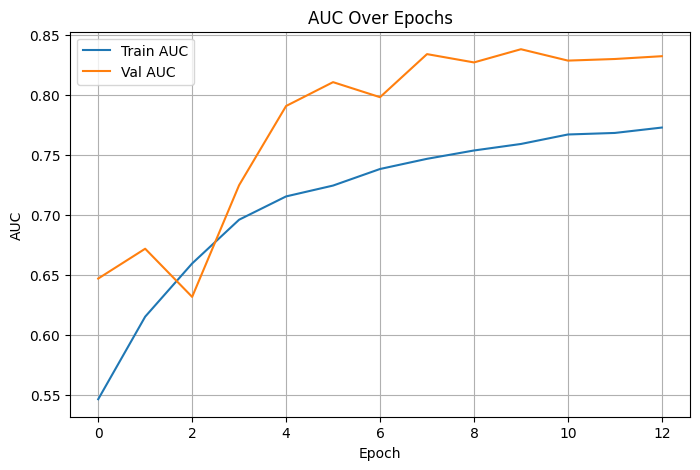

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(history_tuned_resnet.history['auc'], label='Train AUC')
plt.plot(history_tuned_resnet.history['val_auc'], label='Val AUC')
plt.title('AUC Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.legend()
plt.grid(True)
plt.show()

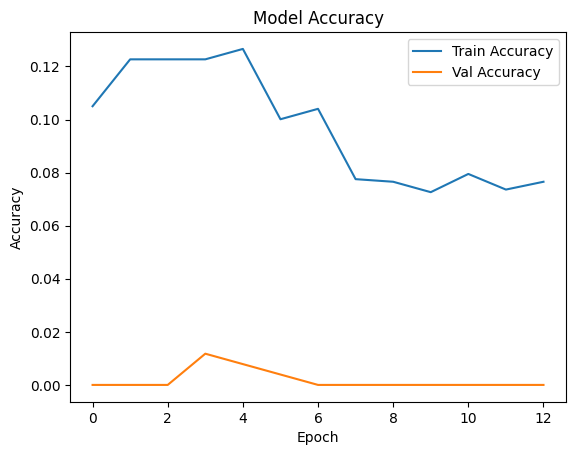

In [ ]:
# Plot accuracy
plt.plot(history_tuned_resnet.history['accuracy'], label='Train Accuracy')
plt.plot(history_tuned_resnet.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

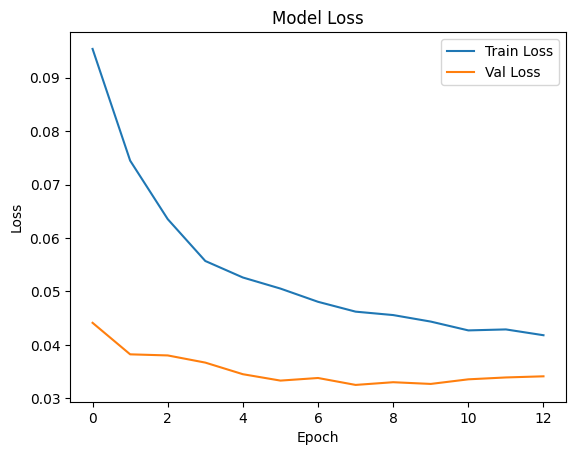

In [ ]:
# Plot loss
plt.plot(history_tuned_resnet.history['loss'], label='Train Loss')
plt.plot(history_tuned_resnet.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

This code safely **reloads and recompiles** fine-tuned multi-label model saved with a custom loss (focal loss):


---

#### **Load Without Compiling**

```python
compile=False
```

* Prevents TensorFlow from trying to load the unknown `focal_loss_multilabel_tuned_v1` immediately.
* Allows you to manually define and reattach the custom components afterward.

---

#### **Redefine Focal Loss**

```python
def focal_loss_multilabel_tuned_v1(...):
```

* Re-creates the exact loss function so it can be attached after loading.
* Required since `load_model()` doesn't save the function code itself.

---

#### **Recompile Model**

```python
model_tuned_fine_tune_resnet.compile(...)
```

* Uses a **low learning rate** (`1e-5`) for safe continued training or evaluation.
* Re-attaches the **focal loss** and **metrics** (`accuracy`, `AUC`) to make the model fully functional again.

---

### Result

Model is now:

* Fully restored
* Ready to **evaluate**, **predict**, or **continue training** seamlessly.



In [ ]:
# Reload without compiling
model_tuned_fine_tune_resnet = tf.keras.models.load_model(
    'Merged_v2/model_tuned_v1_fine_tune_resnet_freeze.h5',
    compile=False  # skip trying to deserialize custom loss
)

# Define focal loss again
def focal_loss_multilabel_tuned_v1(gamma=2., alpha=0.25):
    def loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        pt = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
        return -tf.reduce_mean(alpha * tf.pow(1. - pt, gamma) * tf.math.log(pt))
    return loss

# Recompile after loading

model_tuned_fine_tune_resnet.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss=focal_loss_multilabel_tuned_v1(),
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

This code evaluates the **fine-tuned model** on the test set by collecting predictions and ground truths:

---

### What it does:

* **Loops through the test dataset**, one batch at a time.
* Uses the **fine-tuned model** (`model_tuned_fine_tune_resnet`) to predict outputs.
* Applies a **threshold of 0.5** to convert sigmoid probabilities into binary predictions (`1` for presence, `0` for absence).
* Stores:

  * `y_true_tuned_resnet`: actual multi-label ground truths
  * `y_pred_tuned_resnet`: predicted labels after thresholding

---

### Purpose:

This prepares your data for:

* **Classification report**
* **Confusion matrices**
* **Precision, recall, F1-score**
* **Custom visualizations**

In [ ]:
y_true_tuned_resnet = []
y_pred_tuned_resnet = []

for images, labels in test_dataset:
    preds_tuned_resnet = model_tuned_fine_tune_resnet.predict(images)

    y_true_tuned_resnet.extend(labels.numpy())
    y_pred_tuned_resnet.extend((preds_tuned_resnet > 0.5).astype(int))  # Threshold at 0.5

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━

This code generates a detailed **multi-label classification report** for **fine-tuned model's predictions** (`y_pred_tuned_resnet`) against the ground truth (`y_pred_tuned_resnet`):

---

### **Output Includes for Each Class**:

* **Precision**: How many predicted positives were correct.
* **Recall**: How many actual positives were correctly predicted.
* **F1-score**: Harmonic mean of precision and recall.
* **Support**: Number of true instances for each class.

---

### Additional Notes:

* `target_names` provides human-readable class labels using `id_to_class`.
* `digits=4` ensures high-precision metric output.
* `zero_division=0` avoids errors when there are no true or predicted instances for a class.

This report is critical for evaluating which PPE classes (e.g., helmet, gloves, no\_goggles) are predicted well and where the model needs improvement.




In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix

print("Multi-label Classification Report:")
print(classification_report(
    y_true_tuned_resnet,
    y_pred_tuned_resnet,
    target_names=[id_to_class[i] for i in range(11)],
    digits=4,
    zero_division=0
))

Multi-label Classification Report:
              precision    recall  f1-score   support

      Helmet     0.8431    0.6232    0.7167        69
      Gloves     0.7500    0.9623    0.8430       106
        Vest     0.8000    0.6897    0.7407        58
       Boots     0.7750    0.6200    0.6889        50
     Goggles     0.4667    0.3333    0.3889        42
        none     0.9296    1.0000    0.9635       132
      Person     0.5000    0.1200    0.1935        25
   no_helmet     0.3333    0.1818    0.2353        22
   no_goggle     0.1429    0.0556    0.0800        18
   no_gloves     0.0000    0.0000    0.0000         1
    no_boots     0.0000    0.0000    0.0000         0

   micro avg     0.7806    0.7075    0.7422       523
   macro avg     0.5037    0.4169    0.4410       523
weighted avg     0.7410    0.7075    0.7097       523
 samples avg     0.7829    0.7405    0.7217       523



This code prints **individual confusion matrices** for each of the 11 PPE-related classes, helping you analyze the **fine-tuned model's** predictions class by class.

---

### What It Does:

* Uses `multilabel_confusion_matrix()` to compute a separate **2x2 confusion matrix** for each class.

* Each matrix is of the form:

  ```
  [[TN, FP],
   [FN, TP]]
  ```

  * **TN**: True Negatives
  * **FP**: False Positives
  * **FN**: False Negatives
  * **TP**: True Positives

* Iterates through `id_to_class` to print class names alongside their matrices.

---

### Why It's Useful:

* Gives **clear insight into per-class performance**.
* Helps detect:

  * Classes with many **false positives** (model over-predicts them)
  * Classes with many **false negatives** (model under-predicts them)
* Essential for diagnosing class imbalance or challenging labels (e.g., `no_helmet`, `no_goggles`).


In [ ]:
# Optional: per-class confusion matrices
conf_matrices_tuned_resnet = multilabel_confusion_matrix(y_true_tuned_resnet,     y_pred_tuned_resnet,
)

# Visualize one (e.g. class 0 = Helmet)
#class_index = 0
for id,class_ in id_to_class.items():
  print(id,class_)

  print(f"Confusion matrix for: {id_to_class[id]}")
  print(conf_matrices_tuned_resnet[id])
  print("-"*100)


0 Helmet
Confusion matrix for: Helmet
[[65  8]
 [26 43]]
----------------------------------------------------------------------------------------------------
1 Gloves
Confusion matrix for: Gloves
[[  2  34]
 [  4 102]]
----------------------------------------------------------------------------------------------------
2 Vest
Confusion matrix for: Vest
[[74 10]
 [18 40]]
----------------------------------------------------------------------------------------------------
3 Boots
Confusion matrix for: Boots
[[83  9]
 [19 31]]
----------------------------------------------------------------------------------------------------
4 Goggles
Confusion matrix for: Goggles
[[84 16]
 [28 14]]
----------------------------------------------------------------------------------------------------
5 none
Confusion matrix for: none
[[  0  10]
 [  0 132]]
----------------------------------------------------------------------------------------------------
6 Person
Confusion matrix for: Person
[[114   3]
 [ 



### **Goal**

The goal is to **visually analyze** how **fine-tuned model** performs on each of the 11 classes in your multi-label PPE detection task.

---

### **What Is a Confusion Matrix?**

For each class (e.g., "Helmet"), the confusion matrix is a 2×2 grid showing:

|                 | **Predicted: No**   | **Predicted: Yes**  |
| --------------- | ------------------- | ------------------- |
| **Actual: No**  | True Negative (TN)  | False Positive (FP) |
| **Actual: Yes** | False Negative (FN) | True Positive (TP)  |

This shows:

* **TP**: Correctly predicted present
* **TN**: Correctly predicted absent
* **FP**: Predicted present when it wasn't
* **FN**: Missed a class that was actually there

---

### **What the Code Does**

#### 1. **`plot_confusion_matrix()`**

* Takes a confusion matrix and the class name.
* Uses `seaborn.heatmap()` to make a clear, colored grid.
* Labels axes for readability (Actual vs. Predicted).
* Annotates each cell with the actual numbers.

#### 2. **Loop Through All Classes**

* For each class (`Helmet`, `Gloves`, `no_helmet`, etc.), it plots its own matrix.
* Helps you analyze how well the model detects **each individual class**.

---

### **Why It’s Useful**

* **Instant insights**: You can quickly spot which classes are being predicted poorly.
* **False positives and negatives** stand out visually.
* Helps in **debugging** and deciding where to apply data augmentation, collect more data, or adjust thresholds.

---





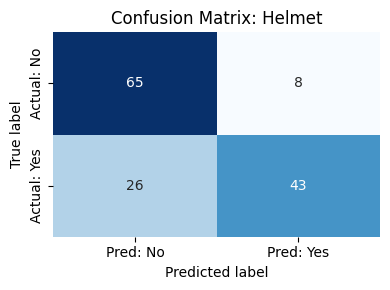

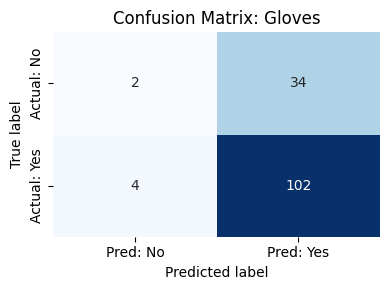

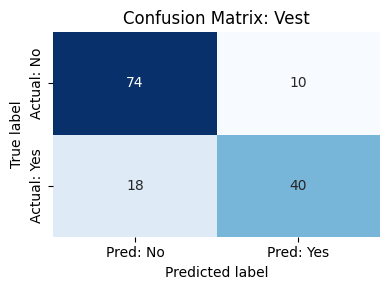

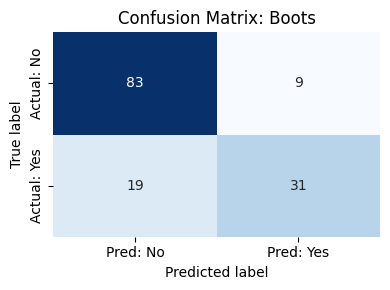

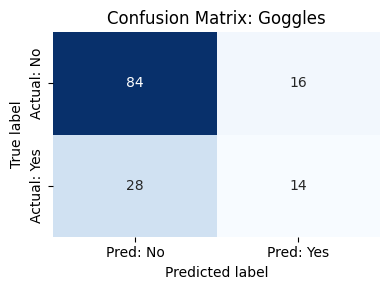

...

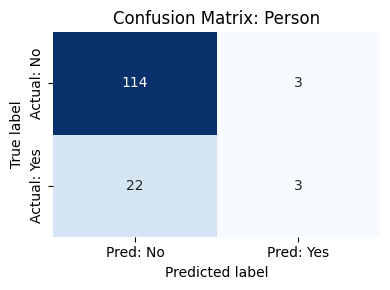

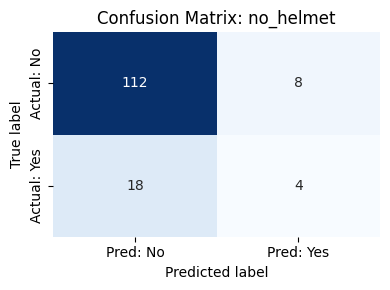

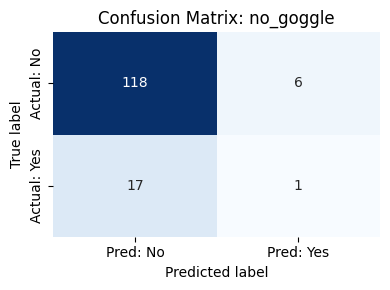

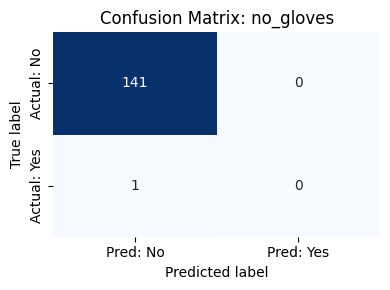

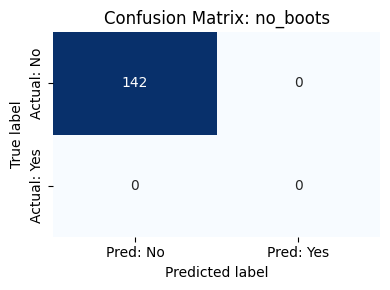

In [ ]:
# Plot heatmaps for each class
for class_id, class_name in id_to_class.items():
    cm = conf_matrices_tuned_resnet[class_id]
    plot_confusion_matrix(cm, class_name)


## **Goal**

To identify which **classes the model struggles with**, by looking at:

1. **False Positives (FP)** — the model predicted a class when it **wasn't actually there**
   → Example: The model says "no\_gloves" but the person is wearing gloves.

2. **False Negatives (FN)** — the model **missed a class** that was actually present
   → Example: The person isn’t wearing a helmet, but the model didn’t detect "no\_helmet".

---

## **What the Code Does**

### Loop through all classes (e.g., Helmet, Person, no\_gloves...)

For each one:

* It gets the **confusion matrix**, which looks like:

  ```
  [[TN, FP],
   [FN, TP]]
  ```
* Then it prints:

  * How many times the model made **false positives** (over-predicting).
  * How many times it made **false negatives** (missed detections).
  * A **warning icon ** if either of those errors is high (e.g., >10 times).

### Example Output:

```
Class: no_gloves
  False Positives: 28 — predicted 'no_gloves' when it wasn't present.
  False Negatives: 37 — missed 'no_gloves' when it was actually present.
  High Error: Investigate this class further.
```

This highlights that **“no\_gloves” is a problem class**, and you might want to:

* Add more examples to the training set
* Check if annotation quality is poor
* Add data augmentation or tweak the loss function

---

## **Why This Is Useful**

* It gives you **a quick summary of where the model makes the most mistakes**, per class.
* Helps you focus your debugging efforts:

  * Is the model too sensitive? (high FP)
  * Is it missing important violations? (high FN)
* This is **especially useful in safety-critical tasks** like PPE detection, where missing a “no\_helmet” is much worse than a small false alarm.

---



In [ ]:
# Print a summary of FP and FN per class
print("Common Mistakes (False Positives & False Negatives):\n")

for class_id, class_name in id_to_class.items():
    cm = conf_matrices_tuned_resnet[class_id]
    tn, fp, fn, tp = cm.ravel()

    print(f"Class: {class_name}")
    print(f"  False Positives: {fp} — predicted '{class_name}' when it wasn't present.")
    print(f"  False Negatives: {fn} — missed '{class_name}' when it was actually present.")

    # Highlight potentially problematic classes
    if fp > 10 or fn > 10:  # threshold can be adjusted
        print(" High Error: Need to Investigate this class further.")

    print("-" * 60)


Common Mistakes (False Positives & False Negatives):

Class: Helmet
  False Positives: 8 — predicted 'Helmet' when it wasn't present.
  False Negatives: 26 — missed 'Helmet' when it was actually present.
 High Error: Need to Investigate this class further.
------------------------------------------------------------
Class: Gloves
  False Positives: 34 — predicted 'Gloves' when it wasn't present.
  False Negatives: 4 — missed 'Gloves' when it was actually present.
 High Error: Need to Investigate this class further.
------------------------------------------------------------
Class: Vest
  False Positives: 10 — predicted 'Vest' when it wasn't present.
  False Negatives: 18 — missed 'Vest' when it was actually present.
 High Error: Need to Investigate this class further.
------------------------------------------------------------
Class: Boots
  False Positives: 9 — predicted 'Boots' when it wasn't present.
  False Negatives: 19 — missed 'Boots' when it was actually present.
 High Error:



### **Objective**

To visually **highlight which classes** your model is struggling with — directly in the confusion matrix grid — using color cues.

---

### **How It Works**

For each class (like `Helmet`, `no_gloves`, etc.), you already have a **2x2 confusion matrix**:

|                 | **Pred: No**   | **Pred: Yes**  |
| --------------- | -------------- | -------------- |
| **Actual: No**  | TN (True Neg)  | FP (False Pos) |
| **Actual: Yes** | FN (False Neg) | TP (True Pos)  |

The code extracts these 4 values:

```python
tn, fp, fn, tp = cm.ravel()
```

Then it checks:

* **Is FP or FN > 10?**
  → If yes, it's a **high-error class** → show title in **red**
* **Is FP or FN > 0?**
  → If yes, it's a **moderate-error class** → show title in **orange**
* **If both FP and FN == 0**
  → Perfect predictions → show title in **green**

---

### **Visual Cues in the Grid**

| Color     | Meaning                           |
| --------- | --------------------------------- |
| 🔴 Red    | High error → lots of mistakes     |
| 🟠 Orange | Some mistakes (moderate issue)    |
| 🟢 Green  | No mistakes → perfect predictions |

This lets you **instantly see** which classes your model:

* **Over-predicts** (high FP)
* **Under-predicts** (high FN)
* **Handles well** (green = safe)

---

### **Why This Is Helpful**

* **Faster diagnosis**: You don’t have to read numbers—color does the work.
* **Prioritize fixes**: Focus your improvement efforts on red-labeled classes.
* **Better reporting**: Clean and intuitive visual for presentations or analysis.
* **Multi-label friendly**: Since it shows performance per class, it works perfectly for your PPE detection task.



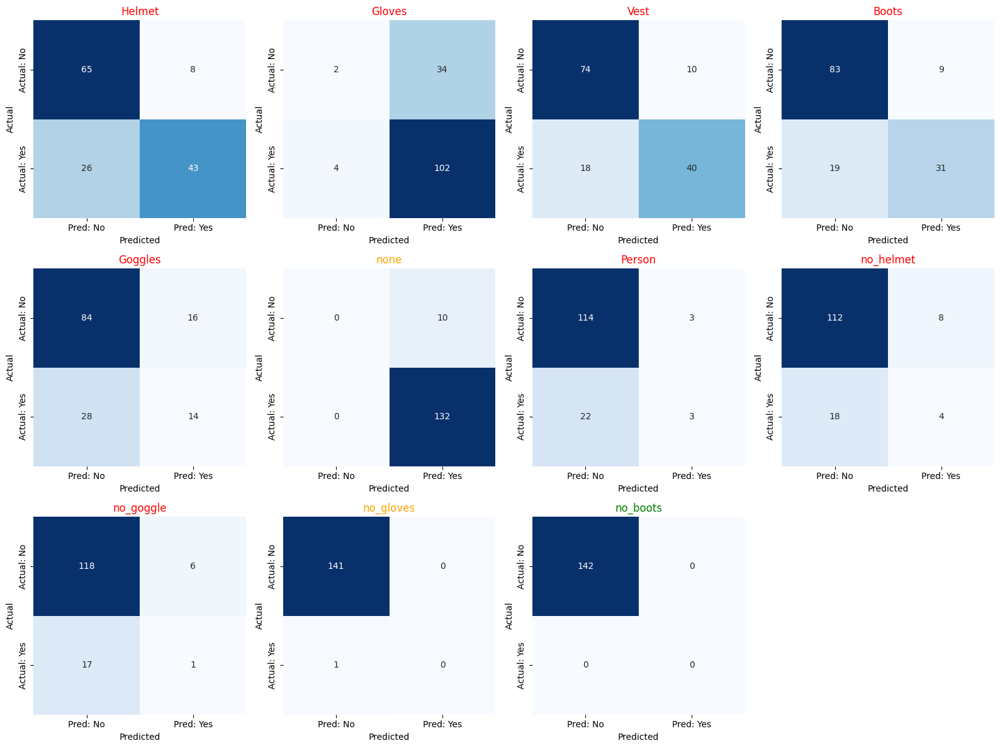

In [ ]:
# Run with tuned confusion matrices
plot_confusion_matrix_grid_colored(conf_matrices_tuned_resnet, [id_to_class[i] for i in range(11)], cols=4)


This code displays 15 test images with their predicted class labels using your fine-tuned multi-label model. For each image:

* It performs prediction with a threshold of 0.5.
* Converts predicted indices to class names.
* Shows the image with predicted labels in the title.

This provides a quick visual check to see how well the model is performing on real examples.


In [ ]:
for image, label in test_dataset.take(50):
    pred = model_tuned_fine_tune_resnet.predict(image)
    pred_classes = [id_to_class[i] for i, p in enumerate(pred[0]) if p > 0.5]
    true_classes = [id_to_class[i] for i, v in enumerate(label[0].numpy()) if v == 1]

    plt.imshow(image[0].numpy())
    plt.axis('off')
    plt.title(f"Predicted: {pred_classes}")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

This code visually compares **model predictions** to **ground truth labels** for 15 test images:

* **Prediction**: Uses  fine-tuned model to predict classes with a threshold of 0.5.
* **Label decoding**: Converts predicted and actual class indices into readable class names using `id_to_class`.
* **Visualization**: Displays each image with both predicted and actual labels shown in the title.

### Why it's useful:

It gives you a clear, side-by-side look at how well  model is performing on real test examples — helping you easily spot mismatches or consistent errors.


In [ ]:
for image, label in test_dataset.take(15):
    pred = model_tuned_fine_tune_resnet.predict(image)
    pred_classes = [id_to_class[i] for i, p in enumerate(pred[0]) if p > 0.5]
    true_classes = [id_to_class[i] for i, v in enumerate(label[0].numpy()) if v == 1]

    plt.imshow(image[0].numpy())
    plt.axis('off')
    plt.title(f"Predicted: {pred_classes}\nActual: {true_classes}")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

# F1-Score,Precision & Recall Comparison: Before vs After Fine-Tuning

This function **compares classification metrics** (e.g., precision, recall, or F1-score) across three model states for each PPE class:

---

### **Function Purpose**

`get_metrics_comparison(...)` generates a **side-by-side bar chart** showing how a chosen metric (like `f1-score`) changes across:

1. **Before fine-tuning EfficientNetV2B3**
2. **After fine-tuning EfficientNetV2B3**
3. **After fine-tuning ResNet101**

---

### **How It Works**

* **`get_scores(...)`** extracts per-class scores from `classification_report(...)` using `output_dict=True`.
* It then builds **metric arrays** (`before_fine_tune_V2B3`, etc.) for each model version.
* Uses `matplotlib` to plot these as grouped **bar plots**, with one bar per model per class.

---

### **Visualization Outcome**

* X-axis: PPE class labels (e.g., Helmet, Gloves, etc.)
* Y-axis: Metric value (0 to 1)
* Bars: One per model per class, color-coded with a legend
* Helps you **visually compare performance gains** per class due to fine-tuning and model architecture choice.

---


In [ ]:
def get_metrics_comparison(metrics,y_true, y_pred, y_true_tuned_v2, y_pred_tuned_v2,y_true_tuned_resnet, y_pred_tuned_resnet,class_labels):

    def get_scores(y_true, y_pred, class_labels):
        report = classification_report(y_true, y_pred, target_names=class_labels, output_dict=True, zero_division=0)
        scores_ = [report[label][metrics] for label in class_labels]
        return scores_


    before_fine_tune_V2B3 = get_scores(y_true, y_pred, class_labels)
    after_fine_tune_V2B3 = get_scores(y_true_tuned_v2, y_pred_tuned_v2, class_labels)
    after_fine_tune_resnet = get_scores(y_true_tuned_resnet, y_pred_tuned_resnet, class_labels)
    x = np.arange(len(class_labels))
    width = 0.25


    # Create bar plot
    plt.figure(figsize=(10, 6))
    plt.bar(x - width/2, before_fine_tune_V2B3, width, label='Before Fine-Tuning EfficientNetV2B3')
    plt.bar(x , after_fine_tune_V2B3, width, label='After Fine-Tuning EfficientNetV2B3')
    plt.bar(x + width/2, after_fine_tune_resnet, width, label='After Fine-Tuning ResNet101')

    plt.xticks(x, class_labels, rotation=45)
    plt.ylabel(f"{metrics}")
    plt.title(f"{metrics} Comparison: Before vs After Fine-Tuning".title())
    plt.ylim(0, 1.1)
    plt.legend()
    plt.tight_layout()
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()


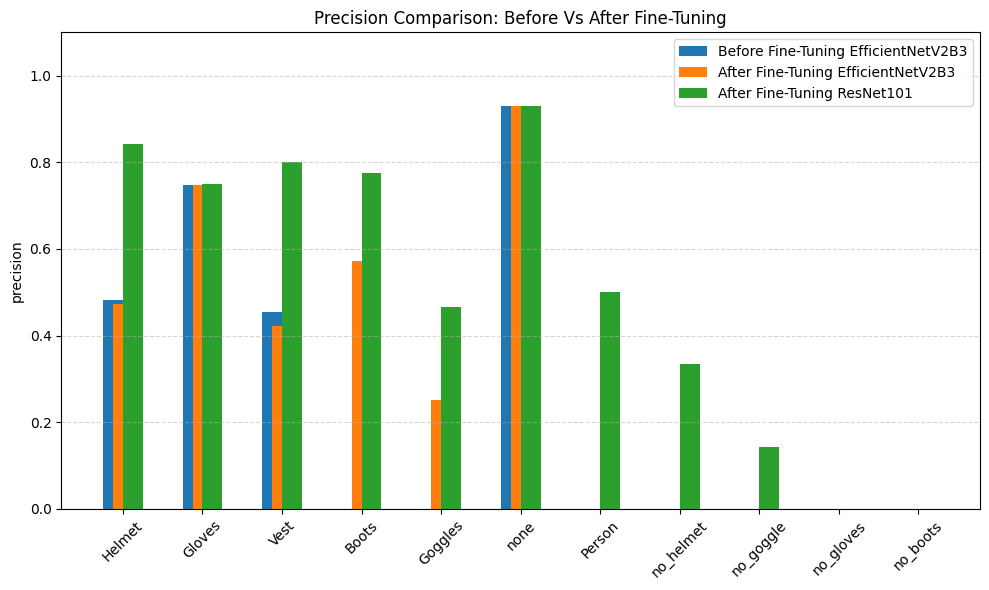

In [ ]:
#precision

get_metrics_comparison('precision',y_true, y_pred, y_true_tuned_v2, y_pred_tuned_v2,y_true_tuned_resnet, y_pred_tuned_resnet,CLASS_NAMES)


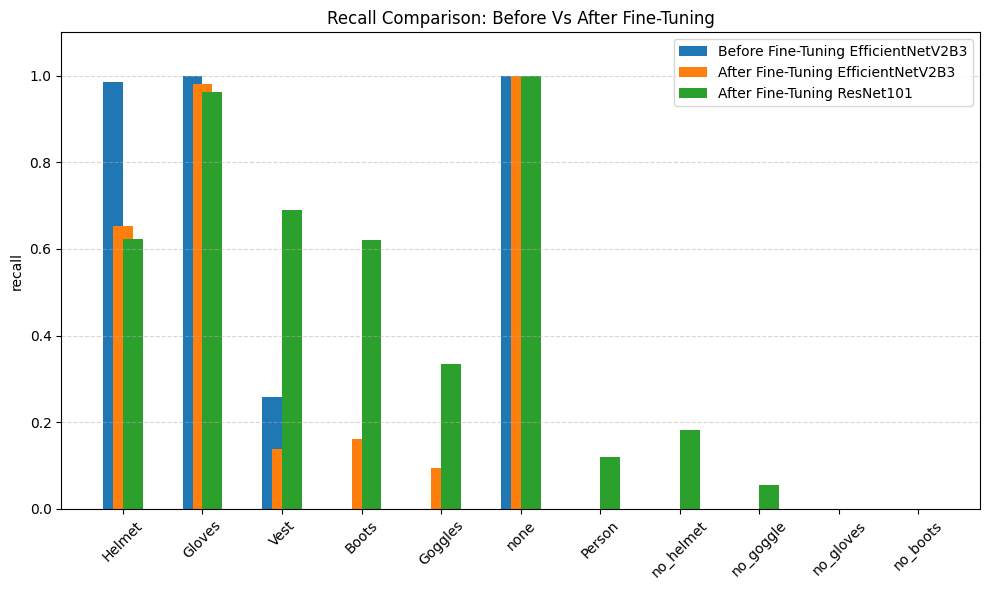

In [ ]:
#recall

get_metrics_comparison('recall',y_true, y_pred, y_true_tuned_v2, y_pred_tuned_v2,y_true_tuned_resnet, y_pred_tuned_resnet,CLASS_NAMES)


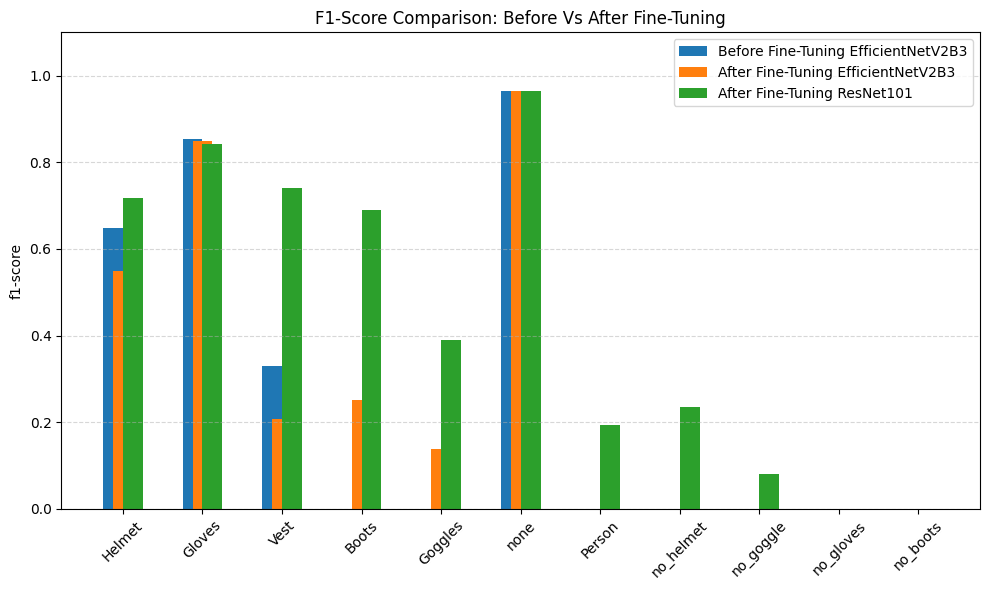

In [ ]:
#f1-score

get_metrics_comparison('f1-score',y_true, y_pred, y_true_tuned_v2, y_pred_tuned_v2,y_true_tuned_resnet, y_pred_tuned_resnet,CLASS_NAMES)


## Model Hosting using Gradio

In [2]:
!pip install -q gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.1/54.1 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.9/322.9 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 50.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 4.2 MB/s eta 0:00:00


This code builds a simple and interactive **Gradio web app** that lets users upload an image and see **multi-label PPE predictions** from fine-tuned model.

---

### **What Each Part Does**

#### **1. Class Map**

```python
class_map_tuned_v1 = {0: 'Helmet', ..., 10: 'no_boots'}
```

Defines a mapping from model output indices to readable class labels.

---

#### **2. Preprocessing**

```python
def preprocess_image_for_model(image, target_size=(640, 640)):
```

* Resizes the input image to match your model's input size.
* Converts BGR (OpenCV) to RGB.
* Normalizes pixel values to `[0, 1]`.
* Expands dimensions to match model input shape `(1, H, W, 3)`.

---

#### **3. Prediction Function**

```python
def predict_ppe_from_image(image):
```

* Processes the input image.
* Runs inference using `model_tuned_fine_tune`.
* Applies a **0.5 threshold** to sigmoid outputs to decide which classes are present.
* Returns class predictions with confidence values **above threshold**, sorted by score.

---

#### **4. Gradio Interface**

```python
gr.Interface(...)
```

Creates a web UI where users can:

* Upload an image
* Get **multi-label PPE predictions** instantly
* See the output in a labeled format (e.g., `"Helmet": 0.91`)

---

### **When You Run It**

A local web server will launch showing:

* A file uploader
* A result box displaying predicted PPE classes with confidence values

---




In [ ]:
# Gradio App to Predict PPE Classes from Uploaded Image Using model_tuned_fine_tune

import gradio as gr
import numpy as np
import cv2
import tensorflow as tf

# === Class Map ===
class_map_tuned_v1 = {
    0: 'Helmet',
    1: 'Gloves',
    2: 'Vest',
    3: 'Boots',
    4: 'Goggles',
    5: 'none',
    6: 'Person',
    7: 'no_helmet',
    8: 'no_goggle',
    9: 'no_gloves',
    10: 'no_boots'
}

class_names_tuned_v1 = [class_map_tuned_v1[i] for i in range(11)]

# === Preprocessing Function ===
def preprocess_image_for_model(image, target_size=(640, 640)):
    image = cv2.resize(image, target_size)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = image.astype(np.float32) / 255.0
    return np.expand_dims(image, axis=0)

# === Prediction Function ===
def predict_ppe_from_image(image):
    if model_tuned_fine_tune_resnet is None:
        return "Model not loaded."

    processed_image = preprocess_image_for_model(image)
    preds = model_tuned_fine_tune_resnet.predict(processed_image)[0]
    threshold = 0.5

    results = {class_names_tuned_v1[i]: float(preds[i]) for i in range(11)}
    return {k: v for k, v in sorted(results.items(), key=lambda x: -x[1]) if v > threshold}

# === Gradio Interface ===
iface = gr.Interface(
    fn=predict_ppe_from_image,
    inputs=gr.Image(type="numpy", label="Upload PPE Image"),
    outputs=gr.Label(num_top_classes=11),
    title="PPE Multi-label Classifier",
    description="Upload an image and the model will predict which PPE items are present or missing.",
    allow_flagging="never"
)

iface.launch(debug=True)


/usr/local/lib/python3.11/dist-packages/gradio/interface.py:415: UserWarning: The `allow_flagging` parameter in `Interface` is deprecated.Use `flagging_mode` instead.
  warnings.warn(


It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://e77778b14e936a146e.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


/usr/local/lib/python3.11/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


/usr/local/lib/python3.11/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


/usr/local/lib/python3.11/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


/usr/local/lib/python3.11/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7861 <> https://e77778b14e936a146e.gradio.live


In [5]:
!pip freeze > requirements.txt